# Лабораторна робота: Stable Diffusion pipelines у Diffusers

**Навчальний Kaggle-notebook**  
Адаптовано на основі Hugging Face Diffusion Course, Unit 3, lesson 2:  
https://huggingface.co/learn/diffusion-course/unit3/2

---

## Коротко про роботу

У цій лабораторній роботі ми вивчаємо, як працюють основні pipeline Stable Diffusion у бібліотеці **Diffusers**:

1. **Text-to-Image** — генерація зображення з текстового prompt.
2. **Pipeline components** — VAE, tokenizer, text encoder, UNet, scheduler.
3. **DIY sampling loop** — ручна реалізація базового diffusion sampling.
4. **Img2Img** — зміна початкового зображення за prompt.
5. **Inpainting** — заміна частини зображення за маскою.
6. **Depth2Img** — генерація з урахуванням depth map.
7. **Порівняння результатів і підготовка звіту.**

Notebook зроблено навчальним: кожен блок має пояснення, завдання для студента, контрольні питання та місце для аналізу.

# 1. Мета лабораторної

Після виконання роботи студент має вміти:

- запускати Stable Diffusion pipeline у Kaggle;
- пояснювати роль `prompt`, `negative_prompt`, `guidance_scale`, `num_inference_steps`, `seed`;
- пояснювати роль основних компонентів pipeline:
  - `VAE`;
  - `tokenizer`;
  - `text_encoder`;
  - `UNet`;
  - `scheduler`;
- показати, як зображення стискається у latent-простір;
- пояснити, що означає scaling factor VAE;
- реалізувати спрощений sampling loop вручну;
- запустити `Img2Img`, `Inpainting`, `Depth2Img`;
- порівняти результати різних pipeline;
- оформити короткий технічний звіт.

---

## Очікуваний результат

У кінці роботи студент має здати:

1. виконаний notebook;
2. generated images;
3. таблицю параметрів;
4. порівняння результатів;
5. відповіді на контрольні питання;
6. короткий висновок про обмеження та етичні ризики.

# 2. Правила безпеки й дозволені типи даних

Stable Diffusion може створювати реалістичні зображення, тому в лабораторній роботі діють обмеження.

## Дозволено

- навчальні prompts без персональних даних;
- власні або відкриті зображення без людей;
- пейзажі, предмети, тварини, іграшки, рослини;
- синтетичні demo images;
- безпечне редагування зображень.

## Заборонено

- генерувати або редагувати реальних людей без згоди;
- створювати deepfake або impersonation;
- використовувати чужі приватні фото;
- створювати NSFW або шкідливий контент;
- використовувати copyrighted characters як об’єкт лабораторної;
- публікувати generated images без перевірки ліцензії та безпеки.

## Для цієї роботи

Ми використовуємо demo-зображення для Img2Img/Inpainting або створюємо простий fallback image автоматично.

# 3. Налаштування Kaggle

Перед запуском перевірте налаштування notebook:

```text
Settings → Accelerator → GPU
Settings → Internet → On
```

Якщо GPU недоступний, більшість cells працюватиме дуже повільно.  
Для навчальної роботи рекомендовано Kaggle GPU T4/P100 або аналогічний GPU.
Для цієї лабораторної рекомендований GPU: T4. Допустимий GPU: P100.

P100 має 16 GB HBM2 і високу пропускну здатність пам’яті, але поточна PyTorch-збірка Kaggle може не підтримувати P100, оскільки P100 має compute capability sm_60.
Якщо з’являється попередження про несумісність P100 із PyTorch, потрібно обрати T4.
T4 x2 не дає автоматичного прискорення, якщо notebook не налаштований на multi-GPU (налаштування не входить в матеріали даної роботи).

In [1]:
# Перевірка GPU та середовища
import os
import sys
import platform
import torch

print("Python:", sys.version)
print("Platform:", platform.platform())
print("PyTorch:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
    total_mem = torch.cuda.get_device_properties(0).total_memory / 1024**3
    print(f"GPU memory: {total_mem:.2f} GB")
else:
    print("GPU не знайдено. У Kaggle перевірте: Settings → Accelerator → GPU")

Python: 3.12.13 (main, Mar  4 2026, 09:23:07) [GCC 11.4.0]
Platform: Linux-6.6.122+-x86_64-with-glibc2.35
PyTorch: 2.10.0+cu128
CUDA available: True
GPU: Tesla T4
GPU memory: 14.56 GB


# 4. Встановлення залежностей

Ця cell встановлює бібліотеки:

- `diffusers`;
- `transformers`;
- `accelerate`;
- `safetensors`;
- `ftfy`;
- `huggingface_hub`;
- `matplotlib`;
- `pillow`.

Якщо cell виконується довго, це нормально: Kaggle встановлює або оновлює пакети.

In [2]:
%%bash
set -e

echo "=== Python ==="
python --version

echo "=== Upgrade pip tools ==="
python -m pip --version

=== Python ===
Python 3.12.13
=== Upgrade pip tools ===
pip 24.1.2 from /usr/local/lib/python3.12/dist-packages/pip (python 3.12)


In [3]:
%%bash
set -e
set -x

echo "=== Install Stable Diffusion dependencies ==="
python -m pip install --no-input --disable-pip-version-check \
  diffusers transformers accelerate safetensors ftfy huggingface_hub pillow matplotlib requests tqdm xformers

echo "=== DONE ==="

=== Install Stable Diffusion dependencies ===
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 40.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.2/12.2 MB 97.7 MB/s eta 0:00:00
  Attempting uninstall: cuda-bindings
    Found existing installation: cuda-bindings 13.2.0
    Uninstalling cuda-bindings-13.2.0:
      Successfully uninstalled cuda-bindings-13.2.0
=== DONE ===


+ echo '=== Install Stable Diffusion dependencies ==='
+ python -m pip install --no-input --disable-pip-version-check diffusers transformers accelerate safetensors ftfy huggingface_hub pillow matplotlib requests tqdm xformers
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask-cuda 26.2.0 requires cuda-core==0.3.*, but you have cuda-core 1.0.1 which is incompatible.
dask-cuda 26.2.0 requires numba-cuda<0.23.0,>=0.22.1, but you have numba-cuda 0.30.2 which is incompatible.
distributed-ucxx-cu12 0.48.0 requires numba-cuda[cu12]<0.23.0,>=0.22.1, but you have numba-cuda 0.30.2 which is incompatible.
cuml-cu12 26.2.0 requires numba<0.62.0,>=0.60.0, but you have numba 0.65.1 which is incompatible.
cuml-cu12 26.2.0 requires numba-cuda[cu12]<0.23.0,>=0.22.1, but you have numba-cuda 0.30.2 which is incompatible.
ucxx-cu12 0.48.0 requires numba-cuda[cu12]<0.23.0,>=0.22.

In [4]:
%%bash
set -e
set -x

python -m pip install xformers

+ python -m pip install xformers


In [5]:
# Перевірка встановлених версій
import importlib

packages = [
    "diffusers",
    "transformers",
    "accelerate",
    "huggingface_hub",
    "safetensors",
    "PIL",
    "matplotlib",
    "torch",
    "xformers"
]

for package in packages:
    try:
        module = importlib.import_module(package)
        version = getattr(module, "__version__", "unknown")
        print(f"{package}: {version}")
    except Exception as e:
        print(f"{package}: not available ({e})")

diffusers: 0.37.1
transformers: 5.0.0
accelerate: 1.13.0
huggingface_hub: 1.10.1
safetensors: 0.7.0
PIL: 11.3.0
matplotlib: 3.10.0
torch: 2.10.0+cu128
xformers: 0.0.35


# 5. Авторизація Hugging Face

Деякі моделі можуть вимагати Hugging Face token або прийняття ліцензії на сторінці моделі.

## Рекомендовано для Kaggle

1. У Kaggle відкрийте **Add-ons → Secrets**.
2. Додайте secret з назвою:

```text
HF_TOKEN
```

3. Створіть власний Hugging Face token з правом `read` та вставте його у secret HF_TOKEN.
4. Увімкніть доступ notebook до secret.

Якщо модель завантажується без token, ця cell просто продовжить роботу.

In [6]:
# Авторизація через Kaggle Secrets або environment variable HF_TOKEN
import os

HF_TOKEN = None

try:
    from kaggle_secrets import UserSecretsClient
    user_secrets = UserSecretsClient()
    HF_TOKEN = user_secrets.get_secret("HF_TOKEN")
    print("HF_TOKEN отримано з Kaggle Secrets.")
except Exception:
    HF_TOKEN = os.environ.get("HF_TOKEN")
    if HF_TOKEN:
        print("HF_TOKEN отримано з environment variable.")
    else:
        print("HF_TOKEN не знайдено. Якщо модель gated, завантаження може не спрацювати.")

if HF_TOKEN:
    from huggingface_hub import login
    login(token=HF_TOKEN)
    os.environ["HF_TOKEN"] = HF_TOKEN
    print("Hugging Face login виконано.")

HF_TOKEN отримано з Kaggle Secrets.
Hugging Face login виконано.


# 6. Імпорти та базові налаштування

У цьому notebook використовується модель:

```text
stabilityai/stable-diffusion-2-1-base
```

Вона відповідає оригінальній логіці Hugging Face Unit 3/2.

Якщо у вас виникне проблема з доступом до моделі, викладач може замінити `MODEL_ID` на іншу доступну text-to-image модель, сумісну з Diffusers.

In [7]:
#перевірка доступності моделей

from huggingface_hub import model_info

for repo_id in [
    "stable-diffusion-v1-5/stable-diffusion-v1-5",
    "stable-diffusion-v1-5/stable-diffusion-inpainting",
    "sd2-community/stable-diffusion-2-depth",
]:
    try:
        info = model_info(repo_id)
        print("OK:", repo_id)
        print("  private:", info.private)
        print("  gated:", info.gated)
    except Exception as e:
        print("ERROR:", repo_id)
        print(type(e).__name__, e)

OK: stable-diffusion-v1-5/stable-diffusion-v1-5
  private: False
  gated: False
OK: stable-diffusion-v1-5/stable-diffusion-inpainting
  private: False
  gated: False
OK: sd2-community/stable-diffusion-2-depth
  private: False
  gated: False


In [8]:
import gc
import math
import random
from pathlib import Path
from io import BytesIO

import numpy as np
import requests
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import torch

from diffusers import (
    StableDiffusionPipeline,
    StableDiffusionImg2ImgPipeline,
    StableDiffusionInpaintPipeline,
    StableDiffusionDepth2ImgPipeline,
    LMSDiscreteScheduler,
)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
DTYPE = torch.float16 if DEVICE == "cuda" else torch.float32

MODEL_ID = "stable-diffusion-v1-5/stable-diffusion-v1-5"
IMAGE_HEIGHT = 512
IMAGE_WIDTH = 512

# Для економії часу можна вимикати важкі секції
RUN_TEXT2IMG = True
RUN_DIY_SAMPLING = True
RUN_IMG2IMG = True
RUN_INPAINTING = True

# Depth2Img завантажує окрему важку модель. Для слабкого GPU можна залишити False.
RUN_DEPTH2IMG = True

OUTPUT_DIR = Path("/kaggle/working/stable_diffusion_lab_outputs")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

print("DEVICE:", DEVICE)
print("DTYPE:", DTYPE)
print("MODEL_ID:", MODEL_ID)
print("OUTPUT_DIR:", OUTPUT_DIR)

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


DEVICE: cuda
DTYPE: torch.float16
MODEL_ID: stable-diffusion-v1-5/stable-diffusion-v1-5
OUTPUT_DIR: /kaggle/working/stable_diffusion_lab_outputs


# 7. Допоміжні функції

Тут зібрано функції для:

- відображення grid-зображень;
- збереження результатів;
- декодування latent tensor у PIL image;
- завантаження demo image з fallback-варіантом.

In [9]:
def show_images(images, titles=None, cols=3, figsize=(15, 5)):
    """Показати список PIL images у вигляді grid."""
    if not isinstance(images, (list, tuple)):
        images = [images]
    n = len(images)
    cols = min(cols, n)
    rows = math.ceil(n / cols)
    plt.figure(figsize=(figsize[0], figsize[1] * rows))
    for i, img in enumerate(images):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        if titles:
            plt.title(titles[i])
        plt.axis("off")
    plt.tight_layout()
    plt.show()


def save_images(images, prefix):
    """Зберегти список PIL images у OUTPUT_DIR."""
    if not isinstance(images, (list, tuple)):
        images = [images]
    paths = []
    for i, img in enumerate(images):
        path = OUTPUT_DIR / f"{prefix}_{i:02d}.png"
        img.save(path)
        paths.append(path)
    print("Saved:")
    for p in paths:
        print(" ", p)
    return paths


def tensor_to_pil(image_tensor):
    """
    Перетворити tensor у формат PIL image.
    Очікується tensor shape [B, 3, H, W] у діапазоні приблизно [-1, 1].
    """
    image = (image_tensor / 2 + 0.5).clamp(0, 1)
    image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
    image = (image * 255).round().astype("uint8")
    return [Image.fromarray(img) for img in image]


def create_fallback_image(size=(512, 512)):
    """
    Створює просте synthetic demo image, якщо завантаження з інтернету недоступне.
    """
    img = Image.new("RGB", size, (210, 225, 240))
    draw = ImageDraw.Draw(img)

    # Небо/земля
    draw.rectangle([0, 0, size[0], int(size[1] * 0.58)], fill=(190, 220, 245))
    draw.rectangle([0, int(size[1] * 0.58), size[0], size[1]], fill=(120, 170, 120))

    # Лавка
    draw.rectangle([120, 310, 390, 330], fill=(120, 80, 45))
    draw.rectangle([130, 335, 380, 350], fill=(120, 80, 45))
    draw.rectangle([150, 350, 165, 430], fill=(80, 55, 35))
    draw.rectangle([345, 350, 360, 430], fill=(80, 55, 35))

    # Людина-схема
    draw.ellipse([230, 170, 285, 225], fill=(235, 190, 150), outline=(70, 60, 50), width=3)
    draw.rectangle([240, 225, 275, 310], fill=(80, 110, 180))
    draw.line([240, 310, 210, 380], fill=(40, 50, 80), width=8)
    draw.line([275, 310, 315, 380], fill=(40, 50, 80), width=8)
    draw.line([240, 245, 200, 285], fill=(80, 110, 180), width=7)
    draw.line([275, 245, 320, 285], fill=(80, 110, 180), width=7)

    # Просте дерево
    draw.rectangle([45, 210, 75, 420], fill=(95, 60, 35))
    draw.ellipse([0, 90, 130, 245], fill=(55, 130, 70))

    return img


def create_fallback_mask(size=(512, 512)):
    """
    Маска для inpainting: біла область буде замінюватися, чорна лишиться.
    """
    mask = Image.new("RGB", size, (0, 0, 0))
    draw = ImageDraw.Draw(mask)
    draw.rectangle([215, 155, 305, 325], fill=(255, 255, 255))
    return mask


def download_image_or_fallback(url, fallback_fn, size=(512, 512), timeout=20):
    try:
        response = requests.get(url, timeout=timeout)
        response.raise_for_status()
        img = Image.open(BytesIO(response.content)).convert("RGB")
        return img.resize(size)
    except Exception as e:
        print("Не вдалося завантажити image з URL. Використовуємо fallback.")
        print("Причина:", repr(e))
        return fallback_fn(size)


def clear_gpu():
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

# 8. Demo image і mask для Img2Img/Inpainting

Оригінальний notebook Hugging Face використовує demo image і mask з GitHub.  
Якщо Kaggle Internet вимкнено або URL недоступний, створиться просте synthetic image.

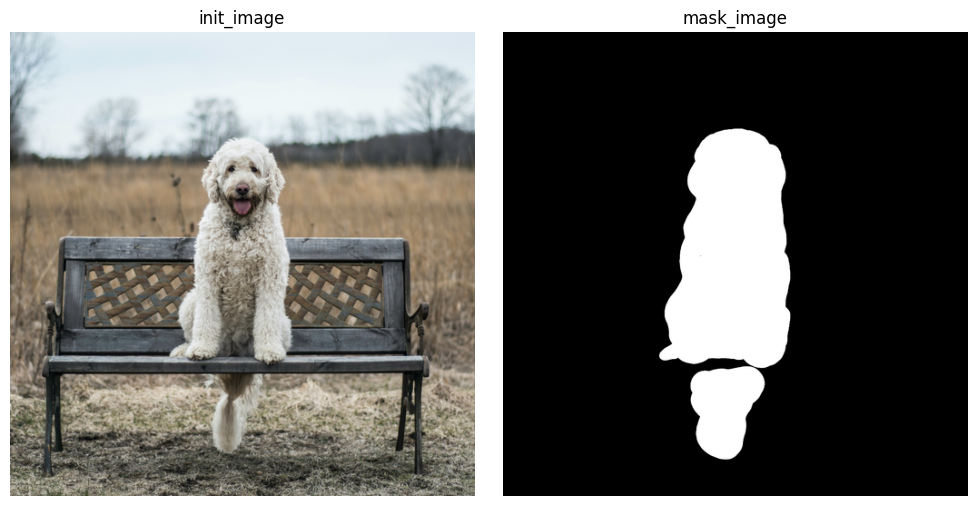

In [10]:
img_url = "https://raw.githubusercontent.com/CompVis/latent-diffusion/main/data/inpainting_examples/overture-creations-5sI6fQgYIuo.png"
mask_url = "https://raw.githubusercontent.com/CompVis/latent-diffusion/main/data/inpainting_examples/overture-creations-5sI6fQgYIuo_mask.png"

init_image = download_image_or_fallback(
    img_url,
    fallback_fn=create_fallback_image,
    size=(IMAGE_WIDTH, IMAGE_HEIGHT)
)

mask_image = download_image_or_fallback(
    mask_url,
    fallback_fn=create_fallback_mask,
    size=(IMAGE_WIDTH, IMAGE_HEIGHT)
)

show_images([init_image, mask_image], titles=["init_image", "mask_image"], cols=2, figsize=(10, 5))

init_image.save(OUTPUT_DIR / "demo_init_image.png")
mask_image.save(OUTPUT_DIR / "demo_mask_image.png")

# 9. Text-to-Image pipeline

Тепер завантажимо `StableDiffusionPipeline`.

## Параметри, які потрібно зрозуміти

| Параметр | Значення |
|---|---|
| `prompt` | що модель має створити |
| `negative_prompt` | чого модель має уникати |
| `guidance_scale` | наскільки сильно модель слідує prompt |
| `num_inference_steps` | кількість denoising-кроків |
| `generator` / `seed` | відтворюваність результату |
| `height`, `width` | розмір зображення, кратний 8 |

## Завдання студента

1. Запустіть базову генерацію.
2. Змініть prompt.
3. Змініть `guidance_scale`.
4. Порівняйте результати.

In [11]:
clear_gpu()

pipe = StableDiffusionPipeline.from_pretrained(
    MODEL_ID,
    torch_dtype=DTYPE,
    use_safetensors=True,
)

pipe = pipe.to(DEVICE)

# Економія пам'яті
pipe.enable_attention_slicing()

try:
    pipe.enable_xformers_memory_efficient_attention()
    print("xFormers enabled.")
except Exception as e:
    print("xFormers не увімкнено. Це не критично:", repr(e))

print("Pipeline loaded:", type(pipe).__name__)
print("Scheduler:", type(pipe.scheduler).__name__)

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

StableDiffusionSafetyChecker LOAD REPORT from: /root/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


xFormers enabled.
Pipeline loaded: StableDiffusionPipeline
Scheduler: PNDMScheduler


  0%|          | 0/30 [00:00<?, ?it/s]

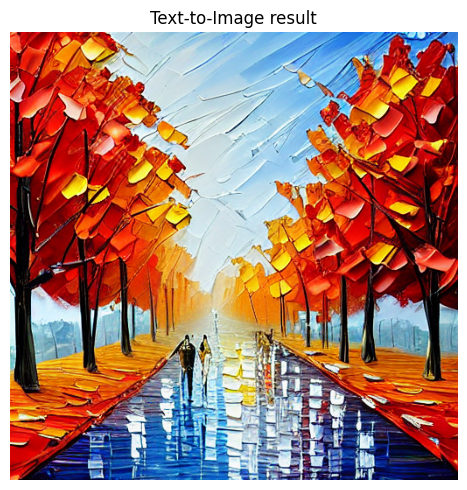

Saved:
  /kaggle/working/stable_diffusion_lab_outputs/text2img_basic_00.png


In [12]:
if RUN_TEXT2IMG:
    prompt = "Palette knife painting of an autumn cityscape"
    negative_prompt = "Oversaturated, blurry, low quality"

    generator = torch.Generator(device=DEVICE).manual_seed(42)

    output = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        height=512,
        width=512,
        guidance_scale=8.0,
        num_inference_steps=30,
        generator=generator,
    )

    text2img_image = output.images[0]
    show_images(text2img_image, titles=["Text-to-Image result"], cols=1)
    save_images(text2img_image, "text2img_basic")

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

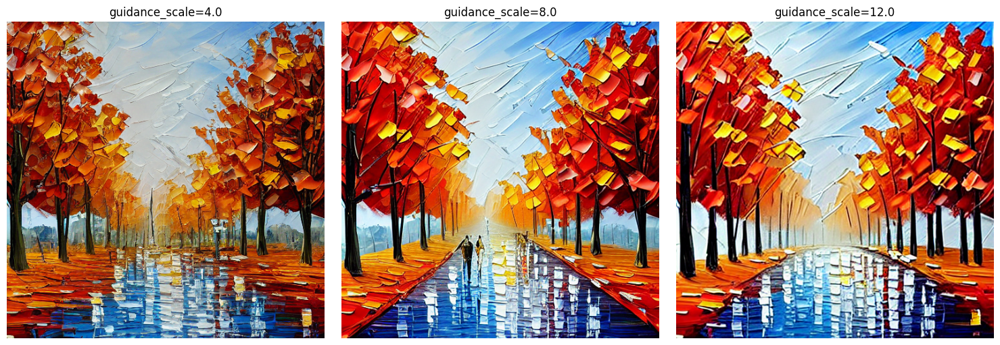

Saved:
  /kaggle/working/stable_diffusion_lab_outputs/text2img_guidance_comparison_00.png
  /kaggle/working/stable_diffusion_lab_outputs/text2img_guidance_comparison_01.png
  /kaggle/working/stable_diffusion_lab_outputs/text2img_guidance_comparison_02.png


In [13]:
if RUN_TEXT2IMG:
    prompt = "Palette knife painting of an autumn cityscape"
    negative_prompt = "Oversaturated, blurry, low quality"

    guidance_values = [4.0, 8.0, 12.0]
    images = []
    titles = []

    for guidance in guidance_values:
        generator = torch.Generator(device=DEVICE).manual_seed(42)

        output = pipe(
            prompt=prompt,
            negative_prompt=negative_prompt,
            height=512,
            width=512,
            guidance_scale=guidance,
            num_inference_steps=30,
            generator=generator,
        )

        images.append(output.images[0])
        titles.append(f"guidance_scale={guidance}")

    show_images(images, titles=titles, cols=3)
    save_images(images, "text2img_guidance_comparison")

### Висновок щодо guidance_scale

При guidance_scale = 4.0 зображення виглядає трохи м'якше. Воно не здається сильно розмитим, але деталізація і контраст нижчі порівняно з іншими варіантами. Загальна ідея prompt зберігається: видно осінній пейзаж, дорогу, дерева і живописний стиль.

При guidance_scale = 8.0 результат виглядає більш чітким і насиченим. Кольори стають яскравішими, краще виділяються дерева, дорога і відображення на воді. Цей варіант виглядає достатньо збалансовано.

При guidance_scale = 12.0 зміни порівняно з 8.0 вже не дуже великі. Найбільше різниця помітна у background: він стає трохи контрастнішим і насиченішим. Основна композиція та стиль залишаються майже такими самими.

Отже, у цьому прикладі збільшення guidance_scale з 4.0 до 8.0 має помітний ефект, а перехід з 8.0 до 12.0 дає вже меншу різницю. Найбільш вдалим виглядає guidance_scale = 8.0, бо він дає хороший баланс між чіткістю, кольорами і природністю результату.

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

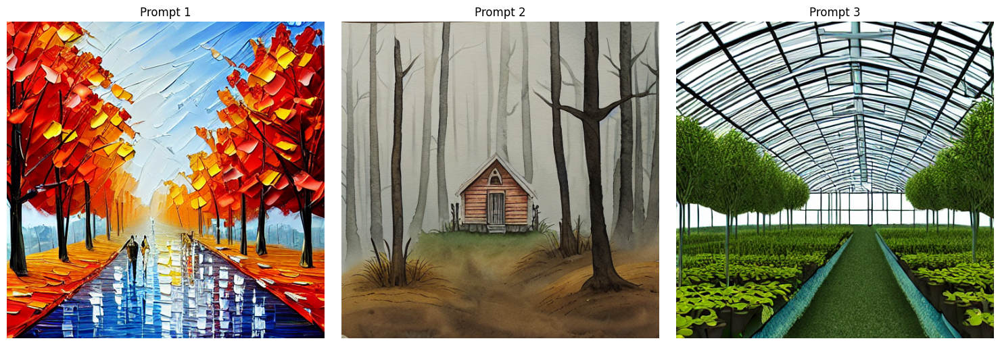

Saved:
  /kaggle/working/stable_diffusion_lab_outputs/text2img_prompt_comparison_00.png
  /kaggle/working/stable_diffusion_lab_outputs/text2img_prompt_comparison_01.png
  /kaggle/working/stable_diffusion_lab_outputs/text2img_prompt_comparison_02.png


In [14]:
if RUN_TEXT2IMG:
    prompts = [
        "Palette knife painting of an autumn cityscape",
        "Watercolor painting of a small forest cabin in the morning fog",
        "Digital art of a futuristic greenhouse with glowing plants",
    ]

    negative_prompt = "Oversaturated, blurry, low quality"
    images = []
    titles = []

    for i, prompt in enumerate(prompts):
        generator = torch.Generator(device=DEVICE).manual_seed(42)

        output = pipe(
            prompt=prompt,
            negative_prompt=negative_prompt,
            height=512,
            width=512,
            guidance_scale=8.0,
            num_inference_steps=30,
            generator=generator,
        )

        images.append(output.images[0])
        titles.append(f"Prompt {i+1}")

    show_images(images, titles=titles, cols=3)
    save_images(images, "text2img_prompt_comparison")

### Висновок щодо зміни prompt

У цьому експерименті було згенеровано три зображення з однаковими параметрами `guidance_scale`, `num_inference_steps` та `seed`, але з різними текстовими описами.

Зміна `prompt` помітно змінює зміст зображення: модель генерує різні сцени, об'єкти та стилі відповідно до текстового запиту. При цьому однаковий `seed` дозволяє зробити експеримент більш відтворюваним, оскільки початковий шум задається однаково.

Отже, `prompt` є основним текстовим керуванням генерацією, а інші параметри визначають, наскільки стабільно, детально та точно модель буде виконувати цей опис.

# 10. Експеримент: вплив `guidance_scale`

`guidance_scale` керує тим, наскільки сильно результат має відповідати prompt.

- Низьке значення: модель має більше свободи, prompt може виконуватись слабше.
- Середнє значення: часто найкращий баланс.
- Дуже високе значення: prompt сильніший, але можливі артефакти.

## Завдання

Запустіть cell і опишіть, який результат найкращий.

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

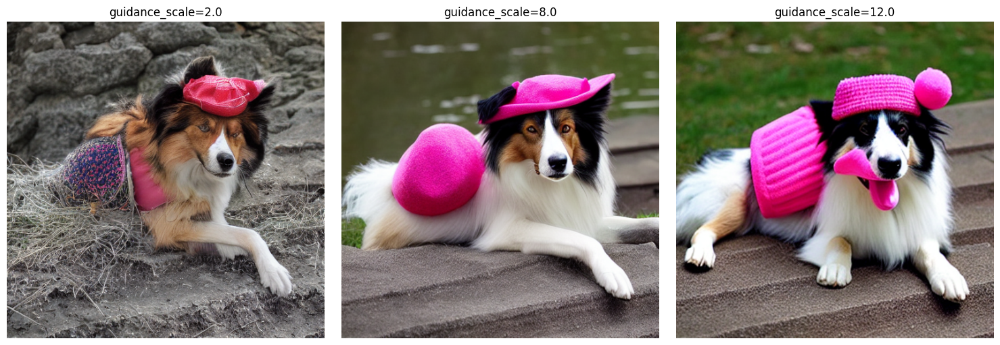

Saved:
  /kaggle/working/stable_diffusion_lab_outputs/guidance_scale_experiment_00.png
  /kaggle/working/stable_diffusion_lab_outputs/guidance_scale_experiment_01.png
  /kaggle/working/stable_diffusion_lab_outputs/guidance_scale_experiment_02.png


In [15]:
if RUN_TEXT2IMG:
    cfg_scales = [2.0, 8.0, 12.0]
    prompt = "A collie dog with a pink hat"
    negative_prompt = "blurry, low quality, distorted"

    cfg_images = []
    cfg_titles = []

    for cfg in cfg_scales:
        generator = torch.Generator(device=DEVICE).manual_seed(123)
        image = pipe(
            prompt=prompt,
            negative_prompt=negative_prompt,
            height=512,
            width=512,
            guidance_scale=cfg,
            num_inference_steps=30,
            generator=generator,
        ).images[0]
        cfg_images.append(image)
        cfg_titles.append(f"guidance_scale={cfg}")

    show_images(cfg_images, titles=cfg_titles, cols=3, figsize=(15, 5))
    save_images(cfg_images, "guidance_scale_experiment")

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

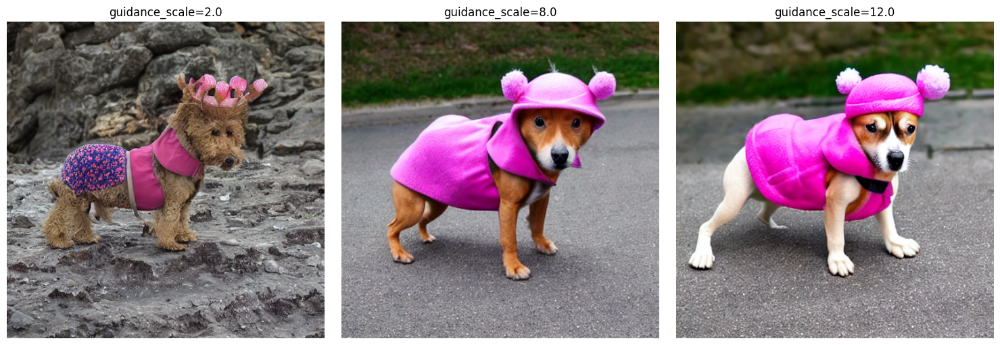

Saved:
  /kaggle/working/stable_diffusion_lab_outputs/guidance_scale_experiment_00.png
  /kaggle/working/stable_diffusion_lab_outputs/guidance_scale_experiment_01.png
  /kaggle/working/stable_diffusion_lab_outputs/guidance_scale_experiment_02.png


In [16]:
if RUN_TEXT2IMG:
    cfg_scales = [2.0, 8.0, 12.0]
    prompt = "A realistic dog wearing a small pink hat only on its head, no clothes, no backpack, no object on its back"
    negative_prompt = "blurry, low quality, distorted"

    cfg_images = []
    cfg_titles = []

    for cfg in cfg_scales:
        generator = torch.Generator(device=DEVICE).manual_seed(123)
        image = pipe(
            prompt=prompt,
            negative_prompt=negative_prompt,
            height=512,
            width=512,
            guidance_scale=cfg,
            num_inference_steps=30,
            generator=generator,
        ).images[0]
        cfg_images.append(image)
        cfg_titles.append(f"guidance_scale={cfg}")

    show_images(cfg_images, titles=cfg_titles, cols=3, figsize=(15, 5))
    save_images(cfg_images, "guidance_scale_experiment")

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

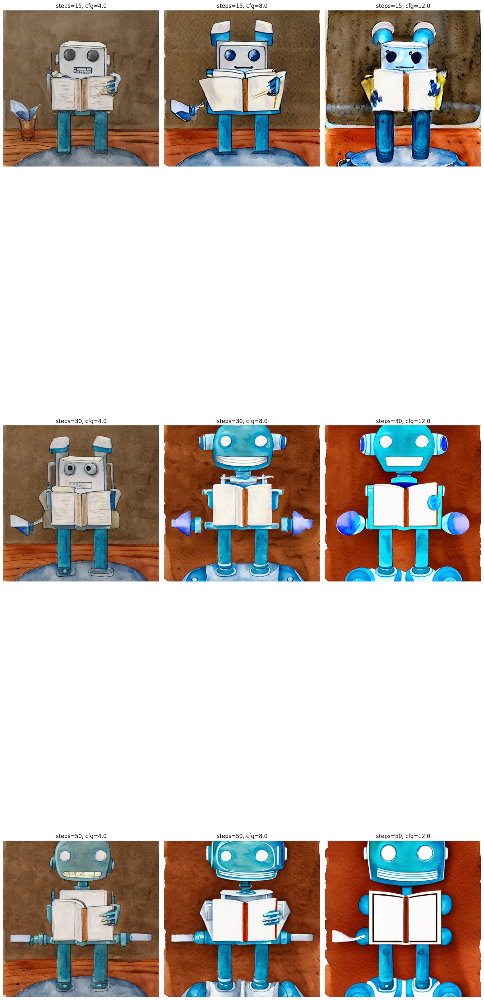

Saved:
  /kaggle/working/stable_diffusion_lab_outputs/steps_guidance_grid_00.png
  /kaggle/working/stable_diffusion_lab_outputs/steps_guidance_grid_01.png
  /kaggle/working/stable_diffusion_lab_outputs/steps_guidance_grid_02.png
  /kaggle/working/stable_diffusion_lab_outputs/steps_guidance_grid_03.png
  /kaggle/working/stable_diffusion_lab_outputs/steps_guidance_grid_04.png
  /kaggle/working/stable_diffusion_lab_outputs/steps_guidance_grid_05.png
  /kaggle/working/stable_diffusion_lab_outputs/steps_guidance_grid_06.png
  /kaggle/working/stable_diffusion_lab_outputs/steps_guidance_grid_07.png
  /kaggle/working/stable_diffusion_lab_outputs/steps_guidance_grid_08.png


In [43]:
if RUN_TEXT2IMG:
    steps_values = [15, 30, 50]
    guidance_values = [4.0, 8.0, 12.0]

    prompt = "A watercolor painting of a small robot reading a book"
    negative_prompt = "blurry, low quality, distorted, ugly"

    experiment_images = []
    experiment_titles = []

    for steps in steps_values:
        for guidance in guidance_values:
            generator = torch.Generator(device=DEVICE).manual_seed(42)

            image = pipe(
                prompt=prompt,
                negative_prompt=negative_prompt,
                height=512,
                width=512,
                guidance_scale=guidance,
                num_inference_steps=steps,
                generator=generator,
            ).images[0]

            experiment_images.append(image)
            experiment_titles.append(f"steps={steps}, cfg={guidance}")

    show_images(
        experiment_images,
        titles=experiment_titles,
        cols=3,
        figsize=(15, 15)
    )

    save_images(experiment_images, "steps_guidance_grid")

### Висновок щодо guidance_scale

У цьому експерименті було порівняно результати генерації з різними значеннями `guidance_scale`: 2.0, 8.0 та 12.0.

При `guidance_scale = 2.0` зображення виглядає найбільш реалістично за стилем. Собака має природнішу позу, шерсть виглядає м'якше, а загальна сцена менш перенасичена. Водночас модель слабше слідує prompt: рожевий елемент виглядає менш чітко, а частина деталей інтерпретована довільно.

При `guidance_scale = 8.0` результат виглядає більш стабільним і акуратним. Собака добре зберігає форму, рожевий колір стає помітнішим, а якість зображення загалом достатньо хороша. Цей варіант можна вважати найбільш збалансованим між реалістичністю і відповідністю prompt.

При `guidance_scale = 12.0` модель найсильніше намагається виконати prompt. Зображення виглядає найбільш повним: собака чітко видима, рожеві елементи добре помітні, композиція більш завершена. Але при такому значенні з'являються артефакти, наприклад неприродна форма рота/язика. Також у всіх трьох варіантах модель частково неправильно зрозуміла prompt: рожевий елемент з'явився не тільки на голові собаки, але й на спині.

Отже, збільшення `guidance_scale` робить результат більш прив'язаним до prompt, але після певного рівня можуть з'являтися дивні деталі. У цьому експерименті `guidance_scale = 8.0` виглядає як найбільш вдалий компроміс, `2.0` дає найреалістичніший стиль, а `12.0` дає найповніше, але менш природне зображення.


# 11. Компоненти Stable Diffusion pipeline

Stable Diffusion — це не одна модель, а система з кількох компонентів.

Основні компоненти:

| Компонент | Роль |
|---|---|
| `VAE` | стискає image у latent space і декодує latent назад в image |
| `tokenizer` | перетворює prompt у token IDs |
| `text_encoder` | перетворює tokens у embeddings |
| `UNet` | прогнозує шум, який треба прибрати |
| `scheduler` | керує denoising-кроками |
| `safety_checker` | може перевіряти небезпечний контент, якщо присутній |

## Завдання

Виведіть список компонентів і знайдіть їх у змінній `pipe`.

In [17]:
def print_pipeline(pipe):
  print("Pipeline components:")
  for name, component in pipe.components.items():
    print(f"{name:20s} -> {type(component).__name__}")

print_pipeline(pipe)

Pipeline components:
vae                  -> AutoencoderKL
text_encoder         -> CLIPTextModel
tokenizer            -> CLIPTokenizer
unet                 -> UNet2DConditionModel
scheduler            -> PNDMScheduler
safety_checker       -> StableDiffusionSafetyChecker
feature_extractor    -> CLIPImageProcessor
image_encoder        -> NoneType


Отже, `pipe` є готовою оболонкою, яка поєднує всі потрібні частини Stable Diffusion в один зручний pipeline.

# 12. VAE: image → latent → image

VAE стискає зображення з pixel space у latent space.

Для Stable Diffusion типове перетворення:

```text
[1, 3, 512, 512] → [1, 4, 64, 64]
```

Тобто VAE зменшує просторовий розмір у 8 разів.

## Важливий момент

Вхід до VAE має бути в діапазоні приблизно `[-1, 1]`, тому в коді часто є нормалізація:

```python
images = torch.rand(...) * 2 - 1
```

А latent масштабується через:

```python
pipe.vae.config.scaling_factor
```

Для багатьох Stable Diffusion моделей це близько `0.18215`.

In [18]:
# Створюємо штучне "зображення" у форматі, який очікує VAE: [-1, 1]
images = torch.rand(
    1, 3, IMAGE_HEIGHT, IMAGE_WIDTH,
    device=DEVICE,
    dtype=DTYPE,
) * 2 - 1

scaling_factor = pipe.vae.config.scaling_factor

with torch.no_grad():
    raw_latents = pipe.vae.encode(images).latent_dist.mean
    latents = raw_latents * scaling_factor
    decoded_images = pipe.vae.decode(latents / scaling_factor).sample

print("images shape:", tuple(images.shape))
print("raw_latents shape:", tuple(raw_latents.shape))
print("scaled latents shape:", tuple(latents.shape))
print("decoded_images shape:", tuple(decoded_images.shape))
print("VAE scaling_factor:", scaling_factor)

images shape: (1, 3, 512, 512)
raw_latents shape: (1, 4, 64, 64)
scaled latents shape: (1, 4, 64, 64)
decoded_images shape: (1, 3, 512, 512)
VAE scaling_factor: 0.18215


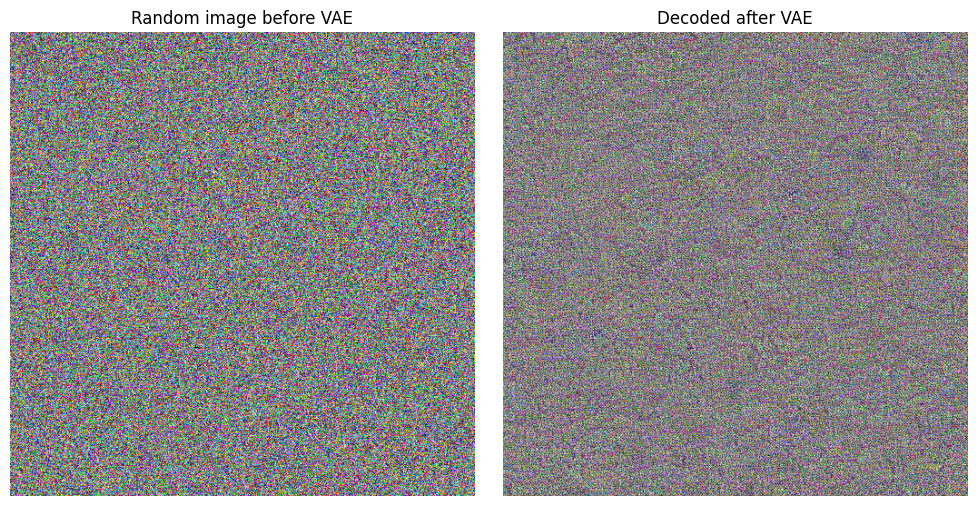

In [19]:
# Візуалізація random input і decoded output
original_pil = tensor_to_pil(images)[0]
decoded_pil = tensor_to_pil(decoded_images)[0]

show_images(
    [original_pil, decoded_pil],
    titles=["Random image before VAE", "Decoded after VAE"],
    cols=2,
    figsize=(10, 5)
)

## Контрольні питання до VAE

1. Чому Stable Diffusion працює в latent space, а не напряму з pixel space?
2. Що означає shape `[1, 4, 64, 64]`?
3. Навіщо потрібен `scaling_factor`?
4. Що буде, якщо забути поділити latents на `scaling_factor` перед VAE decoder?

1. Stable Diffusion працює в `latent space`, тому що це значно зменшує навантаження на GPU. Повне зображення має розмір `[1, 3, 512, 512]`, а після VAE воно стискається до `[1, 4, 64, 64]`. Через це denoising виконується швидше і потребує менше пам'яті.

2. Shape `[1, 4, 64, 64]` означає: один об'єкт у batch, 4 latent-канали і просторовий розмір 64×64. Це внутрішнє стиснене представлення зображення, з яким далі працює U-Net.

3. `scaling_factor` потрібен для правильного масштабу latent-представлення. Після encoder-а VAE latent множиться на `scaling_factor`, а перед decoder-ом виконується зворотна операція: latent ділиться на `scaling_factor`.

4. Якщо забути поділити latent на `scaling_factor` перед VAE decoder, decoder отримає значення у неправильному масштабі. Через це результат може мати шум, дивні кольори, артефакти або загалом виглядати гірше. Отже, VAE стискає зображення у компактний latent, дозволяє diffusion-моделі працювати швидше, а потім відновлює результат у звичайне RGB-зображення.

# 13. Tokenizer і Text Encoder

Prompt не передається в UNet як текст. Він проходить два етапи:

```text
prompt → tokenizer → token IDs → text_encoder → text embeddings
```

Text embeddings потім використовуються як умова для UNet.

In [20]:
prompt = "A painting of a flooble"

text_inputs = pipe.tokenizer(
    prompt,
    padding="max_length",
    max_length=pipe.tokenizer.model_max_length,
    truncation=True,
    return_tensors="pt",
)

input_ids = text_inputs.input_ids
tokens = [pipe.tokenizer.decode([token_id]) for token_id in input_ids[0][:20]]

print("Prompt:", prompt)
print("Tokenizer max length:", pipe.tokenizer.model_max_length)
print("input_ids shape:", tuple(input_ids.shape))
print("First 20 decoded tokens:")
print(tokens)

with torch.no_grad():
    text_embeddings = pipe.text_encoder(input_ids.to(DEVICE))[0]

print("text_embeddings shape:", tuple(text_embeddings.shape))

Prompt: A painting of a flooble
Tokenizer max length: 77
input_ids shape: (1, 77)
First 20 decoded tokens:
['<|startoftext|>', 'a', 'painting', 'of', 'a', 'floo', 'ble', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>']
text_embeddings shape: (1, 77, 768)


In [21]:
prompt = "A painting of a crocozebra"

text_inputs = pipe.tokenizer(
    prompt,
    padding="max_length",
    max_length=pipe.tokenizer.model_max_length,
    truncation=True,
    return_tensors="pt",
)

input_ids = text_inputs.input_ids
tokens = [pipe.tokenizer.decode([token_id]) for token_id in input_ids[0][:20]]

print("Prompt:", prompt)
print("Tokenizer max length:", pipe.tokenizer.model_max_length)
print("input_ids shape:", tuple(input_ids.shape))
print("First 20 decoded tokens:")
print(tokens)

with torch.no_grad():
    text_embeddings = pipe.text_encoder(input_ids.to(DEVICE))[0]

print("text_embeddings shape:", tuple(text_embeddings.shape))

Prompt: A painting of a crocozebra
Tokenizer max length: 77
input_ids shape: (1, 77)
First 20 decoded tokens:
['<|startoftext|>', 'a', 'painting', 'of', 'a', 'cro', 'co', 'zebra', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>']
text_embeddings shape: (1, 77, 768)


In [22]:
my_prompt = "A cozy cyberpunk coffee shop with flooble flowers on the table"

text_inputs = pipe.tokenizer(
    my_prompt,
    padding="max_length",
    max_length=pipe.tokenizer.model_max_length,
    truncation=True,
    return_tensors="pt",
)

input_ids = text_inputs.input_ids
tokens = [pipe.tokenizer.decode([token_id]) for token_id in input_ids[0][:30]]

print("Prompt:", my_prompt)
print("Tokenizer max length:", pipe.tokenizer.model_max_length)
print("input_ids shape:", tuple(input_ids.shape))
print("First 30 decoded tokens:")
print(tokens)

Prompt: A cozy cyberpunk coffee shop with flooble flowers on the table
Tokenizer max length: 77
input_ids shape: (1, 77)
First 30 decoded tokens:
['<|startoftext|>', 'a', 'cozy', 'cyberpunk', 'coffee', 'shop', 'with', 'floo', 'ble', 'flowers', 'on', 'the', 'table', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>', '<|endoftext|>']


## Що важливо помітити

Слово, якого немає у словнику tokenizer, може бути розбите на частини.  
Це важливо для DreamBooth, Textual Inversion і LoRA: спеціальні token треба добирати уважно.

## Завдання

Змініть prompt на свій і подивіться, як tokenizer розбиває слова.

У цьому експерименті було перевірено, як tokenizer обробляє вигадані або рідкісні слова.

Для prompt `A painting of a flooble` слово `flooble` було розбите на два токени: `floo` і `ble`. Це означає, що tokenizer не знайшов таке слово як окрему одиницю у своєму словнику і представив його через менші частини.

Для prompt `A painting of a crocozebra` слово `crocozebra` було розбите на три токени: `cro`, `co` і `zebra`. Тут видно, що tokenizer зміг окремо розпізнати знайому частину `zebra`, а решту слова поділив на коротші фрагменти.

В обох випадках `input_ids` мають форму `(1, 77)`, тому що tokenizer приводить prompt до фіксованої максимальної довжини 77 токенів. Після реальних слів додаються службові токени `<|endoftext|>`, які заповнюють порожні позиції.

`text_embeddings` мають форму `(1, 77, 768)`. Це означає, що кожен із 77 токенів отримує embedding-вектор розміром 768.

Отже, tokenizer може розбивати незнайомі слова на кілька частин. Через це спеціальні або вигадані слова для DreamBooth, Textual Inversion чи LoRA треба добирати уважно, бо від їхнього tokenization залежить те, як модель буде розуміти новий об'єкт або стиль.


# 14. UNet: прогнозування шуму

UNet отримує:

```text
noisy latents + timestep + text embeddings
```

і прогнозує noise residual — шум, який треба прибрати на цьому кроці.

In [23]:
# Підготуємо scheduler timesteps
pipe.scheduler.set_timesteps(30, device=DEVICE)
timestep = pipe.scheduler.timesteps[0]

# Створимо випадкові latents потрібної форми 64х64
latent_channels = pipe.unet.config.in_channels
latent_height = IMAGE_HEIGHT // pipe.vae_scale_factor
latent_width = IMAGE_WIDTH // pipe.vae_scale_factor

test_latents = torch.randn(
    1, latent_channels, latent_height, latent_width,
    device=DEVICE,
    dtype=DTYPE,
)

with torch.no_grad():
    noise_pred = pipe.unet(
        test_latents,
        timestep,
        encoder_hidden_states=text_embeddings.to(dtype=DTYPE),
    ).sample

print("test_latents shape:", tuple(test_latents.shape))
print("noise_pred shape:", tuple(noise_pred.shape))
print("timestep:", timestep)

test_latents shape: (1, 4, 64, 64)
noise_pred shape: (1, 4, 64, 64)
timestep: tensor(958, device='cuda:0')


test_latents       — поточний noisy latent 

timestep           — номер denoising-кроку

text_embeddings    — векторне представлення prompt

## Контрольні питання до UNet

1. Чому форма `noise_pred` така сама, як форма `latents`?
2. Що таке `timestep`?
3. Чому UNet потрібні `text_embeddings`?


1. Форма `noise_pred` така сама, як форма `latents`, тому що UNet прогнозує шум для кожного елемента latent-представлення. Якщо вхідний latent має форму `[1, 4, 64, 64]`, то модель має повернути шум такої самої форми. Потім scheduler використовує цей прогноз, щоб оновити latent на наступному denoising-кроці.

2. `timestep` показує, на якому кроці denoising зараз знаходиться модель. На великих timestep у latent ще багато шуму, а ближче до кінця шуму стає менше. UNet отримує timestep як додаткову інформацію, щоб розуміти, який рівень шуму зараз треба прибирати.

3. `text_embeddings` потрібні UNet для врахування prompt. Сам prompt спочатку проходить через tokenizer і text encoder, після чого перетворюється у векторне представлення. UNet використовує ці embeddings під час генерації, щоб результат відповідав текстовому опису. Наприклад, якщо в prompt написано `a dog with a pink hat`, то через `text_embeddings` модель отримує інформацію про собаку, рожевий капелюх і стиль зображення. Отже, UNet у Stable Diffusion отримує три головні речі: поточний noisy latent, timestep і text embeddings. На основі цього він прогнозує шум, який треба прибрати на поточному кроці.


# 15. Scheduler

Scheduler керує процесом поступового прибирання шуму.

UNet прогнозує шум, а scheduler вирішує, як перейти:

```text
x_t → x_{t-1}
```

У Diffusers можна замінювати scheduler без зміни самої моделі.

У конфігурації scheduler-а зберігаються основні параметри процесу дифузії, наприклад кількість training timestep-ів, тип beta schedule та інші налаштування.

Якщо scheduler має поле alphas_cumprod, можна побудувати графік накопиченого добутку alpha. Це значення показує, яка частина корисного сигналу залишається на різних timestep-ах. На початку значення більше, тому зображення ще зберігає багато інформації. На пізніших timestep-ах значення зменшується, бо шум стає сильнішим.

Отже, scheduler керує технічною логікою diffusion-процесу: він задає timesteps, контролює рівень шуму і допомагає поступово перетворити noisy latent у фінальне зображення.

Current scheduler: PNDMScheduler
Scheduler config keys:
['num_train_timesteps', 'beta_start', 'beta_end', 'beta_schedule', 'trained_betas', 'skip_prk_steps', 'set_alpha_to_one', 'prediction_type', 'timestep_spacing', 'steps_offset', '_use_default_values', '_class_name', '_diffusers_version', 'clip_sample']


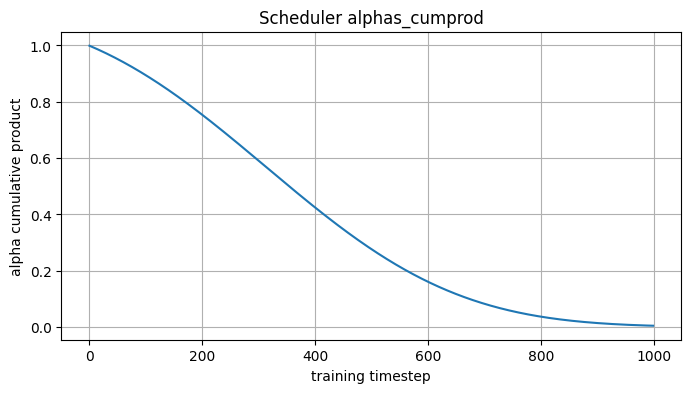

In [24]:
print("Current scheduler:", type(pipe.scheduler).__name__)
print("Scheduler config keys:")
print(list(pipe.scheduler.config.keys())[:20])

# Якщо scheduler має alphas_cumprod, побудуємо графік
if hasattr(pipe.scheduler, "alphas_cumprod"):
    alphas = pipe.scheduler.alphas_cumprod.detach().cpu().numpy()
    plt.figure(figsize=(8, 4))
    plt.plot(alphas)
    plt.title("Scheduler alphas_cumprod")
    plt.xlabel("training timestep")
    plt.ylabel("alpha cumulative product")
    plt.grid(True)
    plt.show()
else:
    print("Цей scheduler не має alphas_cumprod для прямої візуалізації.")

In [25]:
# Приклад створення альтернативного scheduler
alternative_scheduler = LMSDiscreteScheduler.from_config(pipe.scheduler.config)
print("Alternative scheduler:", type(alternative_scheduler).__name__)

Alternative scheduler: LMSDiscreteScheduler


In [26]:
from diffusers import DDIMScheduler

alternative_scheduler = DDIMScheduler.from_config(pipe.scheduler.config)
print("Alternative scheduler:", type(alternative_scheduler).__name__)

Alternative scheduler: DDIMScheduler


In [27]:
from diffusers import DDIMScheduler, DDPMScheduler, EulerDiscreteScheduler, LMSDiscreteScheduler, PNDMScheduler

scheduler_examples = {
    "Default": pipe.scheduler,
    "DDIM": DDIMScheduler.from_config(pipe.scheduler.config),
    "DDPM": DDPMScheduler.from_config(pipe.scheduler.config),
    "Euler": EulerDiscreteScheduler.from_config(pipe.scheduler.config),
    "LMS": LMSDiscreteScheduler.from_config(pipe.scheduler.config),
    "PNDM": PNDMScheduler.from_config(pipe.scheduler.config),
}

for name, scheduler in scheduler_examples.items():
    print(f"{name}: {type(scheduler).__name__}")

# Не замінюємо scheduler глобально автоматично, щоб не ламати подальші cells.
# Якщо потрібно протестувати:
# pipe.scheduler = LMSDiscreteScheduler.from_config(pipe.scheduler.config)

Default: PNDMScheduler
DDIM: DDIMScheduler
DDPM: DDPMScheduler
Euler: EulerDiscreteScheduler
LMS: LMSDiscreteScheduler
PNDM: PNDMScheduler


### Коротке пояснення scheduler-ів

`PNDMScheduler` використовується як default scheduler у цьому pipeline. PNDM можна розглядати як більш швидкий чисельний метод для reverse diffusion. Він використовує ідеї з методів розв'язання диференціальних рівнянь і дозволяє отримувати хорошу якість без дуже великої кількості кроків. Через це він добре підходить для базової генерації Stable Diffusion.

`DDIMScheduler` базується на DDIM-підході. Його головна ідея полягає в тому, що можна проходити denoising не через усі training timesteps, а через меншу кількість вибраних кроків. Завдяки цьому генерація стає швидшою. DDIM часто дає стабільні результати і добре підходить для експериментів, де треба порівняти якість при різній кількості inference steps.

`DDPMScheduler` відповідає класичній логіці DDPM. У DDPM reverse process виконується послідовно: на кожному кроці модель прогнозує шум, після чого scheduler переходить до менш зашумленого стану. Цей підхід добре пояснює базову теорію diffusion-моделей, але для якісної генерації зазвичай потребує більше кроків.

`EulerDiscreteScheduler` використовує Euler method для оновлення latent. Це простий чисельний метод, який робить один крок у напрямку зменшення шуму. На практиці такий scheduler часто дає більш різкі, контрастні або деталізовані результати навіть при невеликій кількості кроків. Особливість `EulerDiscreteScheduler` полягає в тому, що він використовує простий одношаговий чисельний метод. На кожному denoising-кроці UNet прогнозує шум або напрямок зміни latent, а scheduler робить один крок у напрямку менш зашумленого стану.

На відміну від multistep-підходів, Euler в основному спирається на поточний прогноз моделі. Через це він є простішим і часто добре працює навіть при невеликій кількості inference steps. На практиці такий scheduler може давати більш різкі, контрастні та деталізовані зображення, але іноді також може підсилювати артефакти.

`LMSDiscreteScheduler` використовує Linear Multistep method. Його ідея в тому, що для оновлення latent враховується інформація з кількох попередніх кроків. Це може зробити траєкторію denoising більш стабільною, особливо якщо використовується достатня кількість inference steps.

Основна різниця між цими scheduler-ами полягає в алгоритмі оновлення latent на кожному denoising-кроці. Prompt, text encoder, UNet і VAE залишаються тими самими, але шлях від шуму до фінального зображення змінюється. Через це різні scheduler-и можуть давати різну деталізацію, контраст, стабільність, швидкість генерації та кількість артефактів.


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

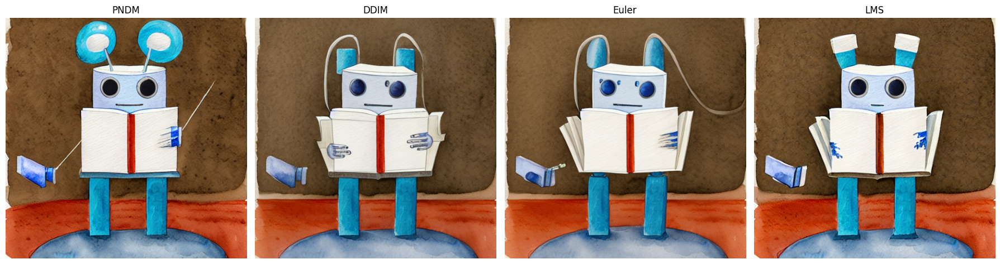

Saved:
  /kaggle/working/stable_diffusion_lab_outputs/scheduler_comparison_00.png
  /kaggle/working/stable_diffusion_lab_outputs/scheduler_comparison_01.png
  /kaggle/working/stable_diffusion_lab_outputs/scheduler_comparison_02.png
  /kaggle/working/stable_diffusion_lab_outputs/scheduler_comparison_03.png


In [28]:
if RUN_TEXT2IMG:
    from diffusers import DDIMScheduler, EulerDiscreteScheduler, LMSDiscreteScheduler, PNDMScheduler

    scheduler_classes = {
        "PNDM": PNDMScheduler,
        "DDIM": DDIMScheduler,
        "Euler": EulerDiscreteScheduler,
        "LMS": LMSDiscreteScheduler,
    }

    prompt = "A watercolor painting of a small robot reading a book"
    negative_prompt = "blurry, low quality, distorted"

    original_scheduler = pipe.scheduler

    scheduler_images = []
    scheduler_titles = []

    for name, scheduler_class in scheduler_classes.items():
        pipe.scheduler = scheduler_class.from_config(original_scheduler.config)

        generator = torch.Generator(device=DEVICE).manual_seed(42)

        image = pipe(
            prompt=prompt,
            negative_prompt=negative_prompt,
            height=512,
            width=512,
            guidance_scale=8.0,
            num_inference_steps=30,
            generator=generator,
        ).images[0]

        scheduler_images.append(image)
        scheduler_titles.append(name)

    pipe.scheduler = original_scheduler

    show_images(
        scheduler_images,
        titles=scheduler_titles,
        cols=4,
        figsize=(18, 5)
    )

    save_images(scheduler_images, "scheduler_comparison")

# 16. Helper для prompt embeddings

У різних версіях Diffusers методи кодування prompt можуть трохи відрізнятися.  
Тому створимо helper, який повертає embeddings для classifier-free guidance.

In [29]:
def get_prompt_embeds(pipe, prompt, negative_prompt="", num_images_per_prompt=1):
    """
    Повертає embeddings у форматі:
    [negative_prompt_embeds, prompt_embeds]
    для classifier-free guidance.
    """
    do_classifier_free_guidance = True

    if hasattr(pipe, "encode_prompt"):
        result = pipe.encode_prompt(
            prompt=prompt,
            device=DEVICE,
            num_images_per_prompt=num_images_per_prompt,
            do_classifier_free_guidance=do_classifier_free_guidance,
            negative_prompt=negative_prompt,
        )
        # У сучасних diffusers повертається tuple: (prompt_embeds, negative_prompt_embeds, ...)
        prompt_embeds = result[0]
        negative_prompt_embeds = result[1]
        text_embeddings = torch.cat([negative_prompt_embeds, prompt_embeds])
        return text_embeddings

    # Fallback для старіших версій
    return pipe._encode_prompt(
        prompt,
        DEVICE,
        num_images_per_prompt,
        do_classifier_free_guidance,
        negative_prompt,
    )

# 17. DIY Sampling Loop: ручна реалізація Text-to-Image

Тепер повторимо те, що робить `StableDiffusionPipeline`, але вручну.

## Алгоритм

```text
1. Закодувати prompt.
2. Створити випадкові latents.
3. Налаштувати scheduler timesteps.
4. Для кожного timestep:
   - продублювати latents для classifier-free guidance;
   - подати latents у UNet;
   - отримати noise prediction;
   - застосувати guidance_scale;
   - виконати scheduler.step().
5. Декодувати latents через VAE.
```

Цей блок важливий для розуміння внутрішньої логіки Diffusion.

In [30]:
def decode_latents_to_pil(pipe, latents):
    """
    Декодує scaled latents Stable Diffusion у PIL images.
    """
    # Повертаємо latent у той масштаб, який очікує VAE decoder
    latents = latents / pipe.vae.config.scaling_factor

    # Декодуємо latent-представлення у зображення
    with torch.no_grad():
        image = pipe.vae.decode(latents, return_dict=False)[0]

    # Переводимо значення з діапазону [-1, 1] у [0, 1]
    image = (image / 2 + 0.5).clamp(0, 1)

    # Переносимо tensor на CPU, змінюємо порядок осей на [B, H, W, C]
    image = image.detach().cpu().permute(0, 2, 3, 1).numpy()

    # Перетворюємо значення у формат uint8 для звичайного зображення
    image = (image * 255).round().astype("uint8")

    # Створюємо список PIL-зображень
    return [Image.fromarray(img) for img in image]


def diy_text2img(
    pipe,
    prompt,
    negative_prompt="",
    height=512,
    width=512,
    num_inference_steps=30,
    guidance_scale=8.0,
    seed=42,
):
    # Фіксуємо seed для відтворюваності результату
    generator = torch.Generator(device=DEVICE).manual_seed(seed)

    # Отримуємо embeddings для prompt і negative_prompt
    # Вони вже підготовлені для classifier-free guidance
    text_embeddings = get_prompt_embeds(
        pipe,
        prompt=prompt,
        negative_prompt=negative_prompt,
        num_images_per_prompt=1,
    ).to(dtype=DTYPE)

    # Готуємо timesteps для процесу denoising
    pipe.scheduler.set_timesteps(num_inference_steps, device=DEVICE)

    # Обчислюємо форму latent-представлення
    # Для 512x512 це зазвичай буде [1, 4, 64, 64]
    latent_shape = (
        1,
        pipe.unet.config.in_channels,
        height // pipe.vae_scale_factor,
        width // pipe.vae_scale_factor,
    )

    # Створюємо початковий випадковий шум у latent space
    latents = torch.randn(
        latent_shape,
        generator=generator,
        device=DEVICE,
        dtype=DTYPE,
    )

    # Масштабуємо початковий шум згідно з вимогами scheduler
    latents = latents * pipe.scheduler.init_noise_sigma

    # Основний цикл reverse diffusion
    for t in pipe.scheduler.timesteps:
        # 1) Дублюємо latent для двох прогнозів:
        #    unconditional і text-conditioned
        latent_model_input = torch.cat([latents] * 2)

        # 2) Виконуємо scheduler-specific scaling перед подачею в UNet
        latent_model_input = pipe.scheduler.scale_model_input(latent_model_input, t)

        # 3) UNet прогнозує noise residual
        with torch.no_grad():
            noise_pred = pipe.unet(
                latent_model_input,
                t,
                encoder_hidden_states=text_embeddings,
            ).sample

        # 4) Розділяємо прогноз на дві частини:
        #    безумовний прогноз і прогноз з урахуванням prompt
        noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)

        # 5) Застосовуємо classifier-free guidance
        #    guidance_scale підсилює вплив prompt на результат
        noise_pred = noise_pred_uncond + guidance_scale * (
            noise_pred_text - noise_pred_uncond
        )

        # 6) Оновлюємо latent: переходимо до менш зашумленого стану
        latents = pipe.scheduler.step(noise_pred, t, latents).prev_sample

    # Декодуємо фінальний latent у звичайне зображення
    return decode_latents_to_pil(pipe, latents)[0]

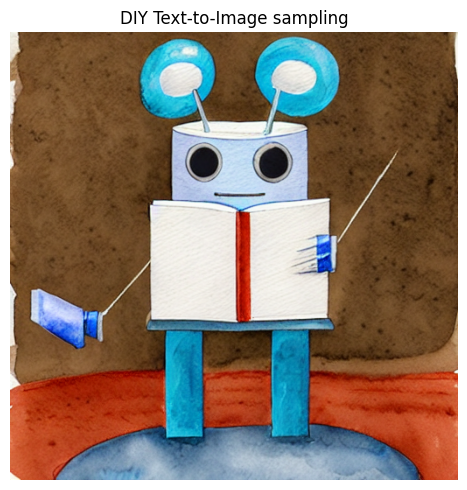

Saved:
  /kaggle/working/stable_diffusion_lab_outputs/diy_text2img_00.png


In [31]:
if RUN_DIY_SAMPLING:
    diy_prompt = "A watercolor painting of a small robot reading a book"
    diy_negative_prompt = "blurry, low quality, distorted"

    diy_image = diy_text2img(
        pipe=pipe,
        prompt=diy_prompt,
        negative_prompt=diy_negative_prompt,
        height=512,
        width=512,
        num_inference_steps=30,
        guidance_scale=8.0,
        seed=42,
    )

    show_images(diy_image, titles=["DIY Text-to-Image sampling"], cols=1)
    save_images(diy_image, "diy_text2img")

## Контрольні питання до DIY sampling

1. На якому етапі використовується prompt?
Prompt використовується на етапі створення text embeddings. Спочатку текстовий prompt і negative prompt передаються у tokenizer і text encoder. Після цього отримані text embeddings подаються в U-Net через encoder_hidden_states. Тобто prompt керує denoising-процесом.
3. Навіщо latents дублюються через `torch.cat([latents] * 2)`?
Latents дублюються для classifier-free guidance. Одна копія використовується для unconditional prediction, тобто прогнозу без текстової умови, а друга копія — для text-conditioned prediction, тобто прогнозу з урахуванням prompt.
Завдяки цьому U-Net за один forward pass рахує обидва варіанти.
5. Що означають `noise_pred_uncond` і `noise_pred_text`?
noise_pred_uncond — це прогноз шуму без урахування prompt. Він показує, як модель прибирала б шум без текстової інструкції.
noise_pred_text — це прогноз шуму з урахуванням prompt. Він показує, як модель прибирала б шум, орієнтуючись на текстовий опис.
7. Що робить формула classifier-free guidance
Формула classifier-free guidance підсилює вплив prompt на генерацію: noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)
Різниця (noise_pred_text - noise_pred_uncond) показує, що саме змінює текстова умова. Параметр guidance_scale визначає, наскільки сильно модель повинна рухатися в напрямку prompt. Якщо guidance_scale малий, модель має більше свободи. Якщо він великий, модель сильніше намагається виконати prompt, але можуть з’явитися артефакти.
9. Чому після sampling треба декодувати latents через VAE?
Після sampling результат ще не є звичайним RGB-зображенням. Це latent representation, тобто стиснуте числове представлення зображення. Щоб отримати нормальну картинку у pixel space, latents потрібно передати у VAE decoder.

DIY sampling loop вручну повторює основну логіку StableDiffusionPipeline. Спочатку prompt перетворюється на text embeddings. Потім створюється випадковий latent noise. На кожному timestep U-Net прогнозує шум, який потрібно прибрати. Для classifier-free guidance latent дублюється: одна частина відповідає unconditional prediction, інша — text-conditioned prediction. Далі ці два прогнози комбінуються через guidance_scale, після чого scheduler виконує один крок denoising. Наприкінці VAE decoder перетворює очищений latent у звичайне RGB-зображення.

# 18. Img2Img pipeline

`Img2Img` не починає з повністю випадкового шуму.  
Він бере початкове зображення, кодує його в latent space, додає шум, а потім виконує denoising за prompt.

## Основна формула

```text
input image
→ VAE encoder
→ image latents
→ add noise
→ denoising with prompt
→ VAE decoder
→ output image
```

## Головний параметр: `strength`

| `strength` | Що відбувається |
|---|---|
| 0.2–0.3 | слабкі зміни, зберігається input |
| 0.5–0.7 | помітні зміни, структура ще зберігається |
| 0.8–1.0 | сильні зміни, input майже зникає |

## Завдання

Запустіть Img2Img із різними `strength` і порівняйте результати.

## 18.1 DIY Img2Img loop: ручна логіка

У цьому блоці ми вручну повторюємо головну ідею Img2Img:

```text
input image
→ VAE encoder
→ image latents
→ додавання шуму залежно від strength
→ denoising loop
→ VAE decoder
→ output image
```

Цей код потрібен не для найкращої якості, а для розуміння механіки.

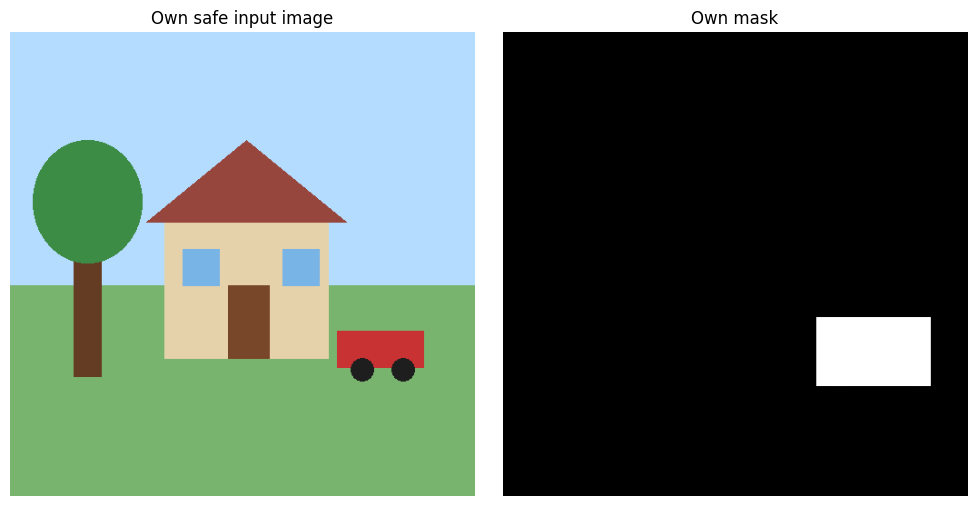

Saved:
  /kaggle/working/stable_diffusion_lab_outputs/own_input_and_mask_00.png
  /kaggle/working/stable_diffusion_lab_outputs/own_input_and_mask_01.png


[PosixPath('/kaggle/working/stable_diffusion_lab_outputs/own_input_and_mask_00.png'),
 PosixPath('/kaggle/working/stable_diffusion_lab_outputs/own_input_and_mask_01.png')]

In [32]:
# Власна безпечна мас Img2Img/Inpainting

from PIL import Image, ImageDraw

def create_own_safe_image(size=(512, 512)):
    img = Image.new("RGB", size, (190, 220, 255))
    draw = ImageDraw.Draw(img)

    # небо та трава
    draw.rectangle([0, 0, 512, 280], fill=(180, 220, 255))
    draw.rectangle([0, 280, 512, 512], fill=(120, 180, 110))

    # дім
    draw.rectangle([170, 210, 350, 360], fill=(230, 210, 170))
    draw.polygon([(150, 210), (260, 120), (370, 210)], fill=(150, 70, 60))

    # двері та вікна
    draw.rectangle([240, 280, 285, 360], fill=(120, 70, 40))
    draw.rectangle([190, 240, 230, 280], fill=(120, 180, 230))
    draw.rectangle([300, 240, 340, 280], fill=(120, 180, 230))

    # дерево
    draw.rectangle([70, 230, 100, 380], fill=(100, 60, 35))
    draw.ellipse([25, 120, 145, 255], fill=(60, 140, 70))

    # маленька машина
    draw.rectangle([360, 330, 455, 370], fill=(200, 50, 50))
    draw.ellipse([375, 360, 400, 385], fill=(30, 30, 30))
    draw.ellipse([420, 360, 445, 385], fill=(30, 30, 30))

    return img


def create_own_mask(size=(512, 512)):
    # black = keep, white = edit
    mask = Image.new("RGB", size, (0, 0, 0))
    draw = ImageDraw.Draw(mask)

    # редагувати коло машини
    draw.rectangle([345, 315, 470, 390], fill=(255, 255, 255))

    return mask


init_image = create_own_safe_image()
mask_image = create_own_mask()

show_images(
    [init_image, mask_image],
    titles=["Own safe input image", "Own mask"],
    cols=2,
    figsize=(10, 5)
)

save_images([init_image, mask_image], "own_input_and_mask")

In [33]:
def prepare_pil_image_for_vae(image, height=512, width=512):
    """
    PIL image → torch tensor у форматі [1, 3, H, W] і діапазоні [-1, 1].
    """
    image = image.convert("RGB").resize((width, height))
    image_np = np.array(image).astype(np.float32) / 255.0
    image_np = image_np.transpose(2, 0, 1)
    image_tensor = torch.from_numpy(image_np).unsqueeze(0)
    image_tensor = image_tensor * 2.0 - 1.0
    return image_tensor.to(device=DEVICE, dtype=DTYPE)


def diy_img2img(
    pipe,
    init_image,
    prompt,
    negative_prompt="",
    strength=0.6,
    num_inference_steps=30,
    guidance_scale=7.5,
    seed=42,
    height=512,
    width=512,
):
    """
    Спрощена ручна реалізація Img2Img.
    """
    generator = torch.Generator(device=DEVICE).manual_seed(seed)

    # 1. PIL image → tensor → VAE latents
    image_tensor = prepare_pil_image_for_vae(init_image, height=height, width=width)

    with torch.no_grad():
        init_latents = pipe.vae.encode(image_tensor).latent_dist.mean
        init_latents = init_latents * pipe.vae.config.scaling_factor

    # 2. Prompt embeddings
    text_embeddings = get_prompt_embeds(
        pipe,
        prompt=prompt,
        negative_prompt=negative_prompt,
        num_images_per_prompt=1,
    ).to(dtype=DTYPE)

    # 3. Scheduler timesteps
    pipe.scheduler.set_timesteps(num_inference_steps, device=DEVICE)

    init_timestep = min(int(num_inference_steps * strength), num_inference_steps)
    t_start = max(num_inference_steps - init_timestep, 0)
    timesteps = pipe.scheduler.timesteps[t_start:]

    if len(timesteps) == 0:
        raise ValueError("strength занадто малий: немає denoising timesteps.")

    # 4. Додаємо шум до image latents
    noise = torch.randn(
        init_latents.shape,
        generator=generator,
        device=DEVICE,
        dtype=DTYPE,
    )

    latent_timestep = timesteps[:1]
    latents = pipe.scheduler.add_noise(init_latents, noise, latent_timestep)

    # 5. Denoising loop
    for t in timesteps:
        latent_model_input = torch.cat([latents] * 2)
        latent_model_input = pipe.scheduler.scale_model_input(latent_model_input, t)

        with torch.no_grad():
            noise_pred = pipe.unet(
                latent_model_input,
                t,
                encoder_hidden_states=text_embeddings,
            ).sample

        noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
        noise_pred = noise_pred_uncond + guidance_scale * (
            noise_pred_text - noise_pred_uncond
        )

        latents = pipe.scheduler.step(noise_pred, t, latents).prev_sample

    # 6. Latents → PIL image
    return decode_latents_to_pil(pipe, latents)[0]

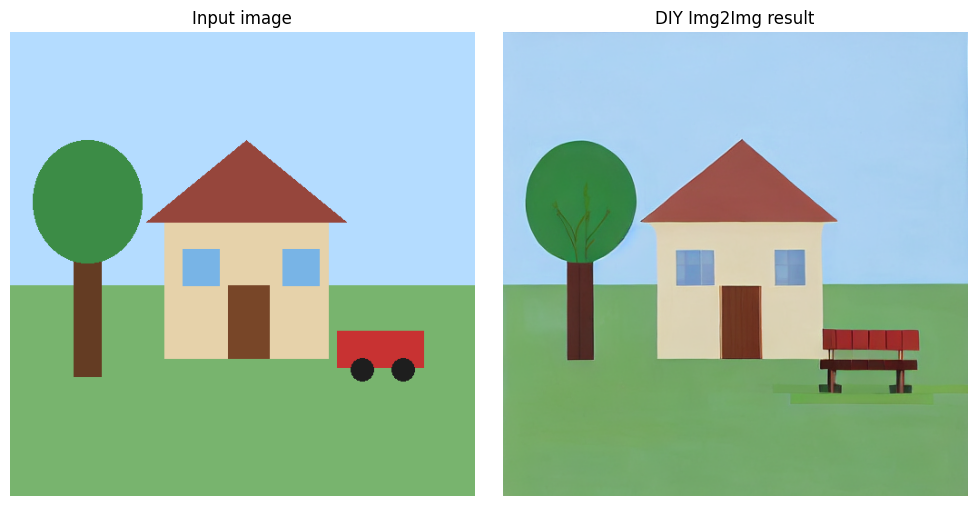

Saved:
  /kaggle/working/stable_diffusion_lab_outputs/diy_img2img_00.png


In [34]:
if RUN_IMG2IMG:
    #diy_img2img_prompt = "An oil painting of a person sitting on a park bench, warm light, high detail. The person sits facing the viewer."
    diy_img2img_prompt = (
       "A front-facing person sitting on a park bench, looking at the viewer, "
       "highly detailed face, natural skin, "
       "oil painting, warm light, high detail"
    )
    
    negative_prompt = (
       "back view, distorted face, from behind, turned away, rear view, no face, blurry, low quality,"
       "blurry face, deformed face, distorted face, bad eyes, bad nose, bad mouse, malformed eyes, poorly drawn face,"
       "extra fingers, low quality, blurry, ugly"
    )
    
    diy_img2img_image = diy_img2img(
        pipe=pipe,
        init_image=init_image,
        prompt=diy_img2img_prompt,
        negative_prompt= negative_prompt,
        strength=0.60,
        num_inference_steps=30,
        guidance_scale=7.5,
        seed=42,
        height=512,
        width=512,
    )

    show_images(
        [init_image, diy_img2img_image],
        titles=["Input image", "DIY Img2Img result"],
        cols=2,
        figsize=(10, 5)
    )

    save_images(diy_img2img_image, "diy_img2img")

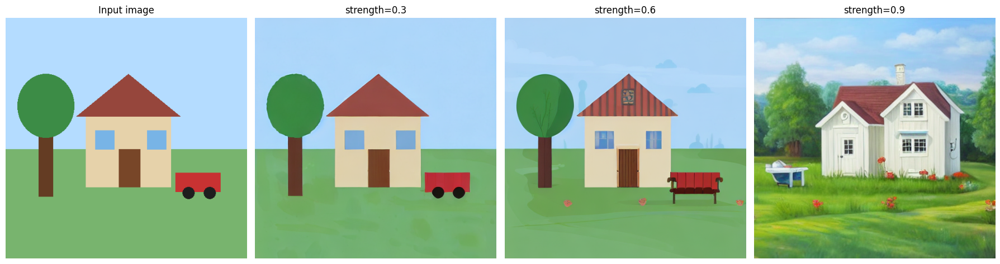

Saved:
  /kaggle/working/stable_diffusion_lab_outputs/diy_img2img_strength_comparison_00.png
  /kaggle/working/stable_diffusion_lab_outputs/diy_img2img_strength_comparison_01.png
  /kaggle/working/stable_diffusion_lab_outputs/diy_img2img_strength_comparison_02.png


In [35]:
if RUN_IMG2IMG:
    diy_img2img_prompt = (
        "A cozy countryside house with a garden, oil painting, warm light, "
        "high detail, soft colors"
    )

    negative_prompt = (
        "blurry, low quality, distorted, ugly, bad shapes, artifacts"
    )

    strength_values = [0.3, 0.6, 0.9]

    diy_strength_images = []
    diy_strength_titles = []

    for strength in strength_values:
        image = diy_img2img(
            pipe=pipe,
            init_image=init_image,
            prompt=diy_img2img_prompt,
            negative_prompt=negative_prompt,
            strength=strength,
            num_inference_steps=30,
            guidance_scale=7.5,
            seed=42,
            height=512,
            width=512,
        )

        diy_strength_images.append(image)
        diy_strength_titles.append(f"strength={strength}")

    show_images(
        [init_image] + diy_strength_images,
        titles=["Input image"] + diy_strength_titles,
        cols=4,
        figsize=(18, 5)
    )

    save_images(diy_strength_images, "diy_img2img_strength_comparison")

### Висновок

У цьому експерименті було перевірено вплив параметра `strength` на результат Img2Img. При `strength = 0.3` модель майже повністю зберігає початкове зображення і лише трохи змінює стиль. При `strength = 0.6` зміни стають помітнішими, але основна композиція ще добре зберігається. При `strength = 0.9` модель суттєво переробляє сцену, додає більше деталей і сильніше орієнтується на prompt. Отже, чим більше значення `strength`, тим сильніше Img2Img змінює input image.


## 18.2 Готовий `StableDiffusionImg2ImgPipeline`

Після ручного розбору використовуємо готовий pipeline.  
У практичній роботі саме цей варіант є основним, бо він коротший і стабільніший.

In [36]:
if RUN_IMG2IMG:
    clear_gpu()

    img2img_pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
        MODEL_ID,
        torch_dtype=DTYPE,
        use_safetensors=True,
    ).to(DEVICE)

    img2img_pipe.enable_attention_slicing()

    print_pipeline(img2img_pipe)
    try:
        img2img_pipe.enable_xformers_memory_efficient_attention()
    except Exception:
        pass

    print("Img2Img pipeline loaded:", type(img2img_pipe).__name__)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

StableDiffusionSafetyChecker LOAD REPORT from: /root/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Pipeline components:
vae                  -> AutoencoderKL
text_encoder         -> CLIPTextModel
tokenizer            -> CLIPTokenizer
unet                 -> UNet2DConditionModel
scheduler            -> PNDMScheduler
safety_checker       -> StableDiffusionSafetyChecker
feature_extractor    -> CLIPImageProcessor
image_encoder        -> NoneType
Img2Img pipeline loaded: StableDiffusionImg2ImgPipeline


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

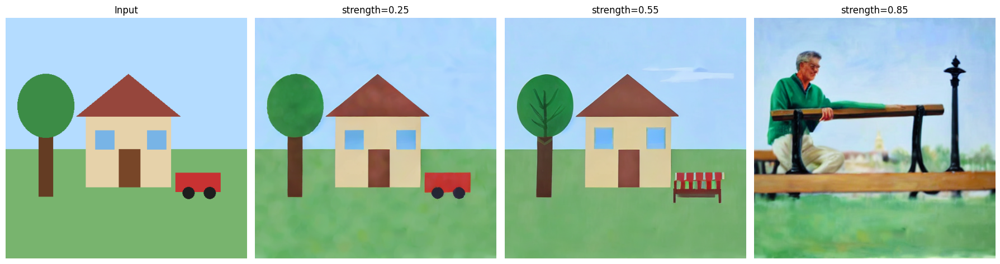

Saved:
  /kaggle/working/stable_diffusion_lab_outputs/img2img_strength_experiment_00.png
  /kaggle/working/stable_diffusion_lab_outputs/img2img_strength_experiment_01.png
  /kaggle/working/stable_diffusion_lab_outputs/img2img_strength_experiment_02.png


In [37]:
if RUN_IMG2IMG:
   
    img2img_prompt = (
       "A front-facing person sitting on a park bench, looking at the viewer, "
       "highly detailed face, natural skin, "
       "oil painting, warm light, high detail"
    )
    
    img2img_negative_prompt = (
       "back view, distorted face, from behind, turned away, rear view, no face, blurry, low quality,"
       "blurry face, deformed face, distorted face, bad eyes, bad nose, bad mouse, malformed eyes, poorly drawn face,"
       "extra fingers,extra legs, low quality, blurry, ugly"
    )
    strengths = [0.25, 0.55, 0.85]
    img2img_results = []
    img2img_titles = []

    for strength in strengths:
        generator = torch.Generator(device=DEVICE).manual_seed(42)

        result = img2img_pipe(
            prompt=img2img_prompt,
            negative_prompt=img2img_negative_prompt,
            image=init_image,
            strength=strength,
            guidance_scale=7.5,
            num_inference_steps=30,
            generator=generator,
        ).images[0]

        img2img_results.append(result)
        img2img_titles.append(f"strength={strength}")

    show_images([init_image] + img2img_results, titles=["Input"] + img2img_titles, cols=4, figsize=(18, 5))
    save_images(img2img_results, "img2img_strength_experiment")

## Контрольні питання до Img2Img

1. Чим Img2Img відрізняється від Text-to-Image?
2. Що робить параметр `strength`?
3. При якому `strength` input image зберігається найкраще?
4. При якому `strength` prompt має найбільший вплив?

# 19. Inpainting pipeline

`Inpainting` потрібен, коли треба змінити тільки частину зображення.

Використовується:

- `image` — початкове зображення;
- `mask_image` — маска;
- `prompt` — що згенерувати у masked-області.

## Правило маски

```text
white area  → замінити
black area  → зберегти
```

У цьому notebook ми використовуємо `StableDiffusionInpaintPipeline`.

In [38]:
if RUN_INPAINTING:
    clear_gpu()

    INPAINT_MODEL_ID = "stable-diffusion-v1-5/stable-diffusion-inpainting"

    inpaint_pipe = StableDiffusionInpaintPipeline.from_pretrained(
        INPAINT_MODEL_ID,
        torch_dtype=DTYPE
    ).to(DEVICE)

    inpaint_pipe.enable_attention_slicing()

    print_pipeline(inpaint_pipe)

    try:
        inpaint_pipe.enable_xformers_memory_efficient_attention()
    except Exception:
        pass

    print("Inpainting pipeline loaded:", type(inpaint_pipe).__name__)

model_index.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

StableDiffusionSafetyChecker LOAD REPORT from: /root/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to r

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--stable-diffusion-v1-5--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


Pipeline components:
vae                  -> AutoencoderKL
text_encoder         -> CLIPTextModel
tokenizer            -> CLIPTokenizer
unet                 -> UNet2DConditionModel
scheduler            -> DDIMScheduler
safety_checker       -> StableDiffusionSafetyChecker
feature_extractor    -> CLIPImageProcessor
image_encoder        -> NoneType
Inpainting pipeline loaded: StableDiffusionInpaintPipeline


  0%|          | 0/30 [00:00<?, ?it/s]

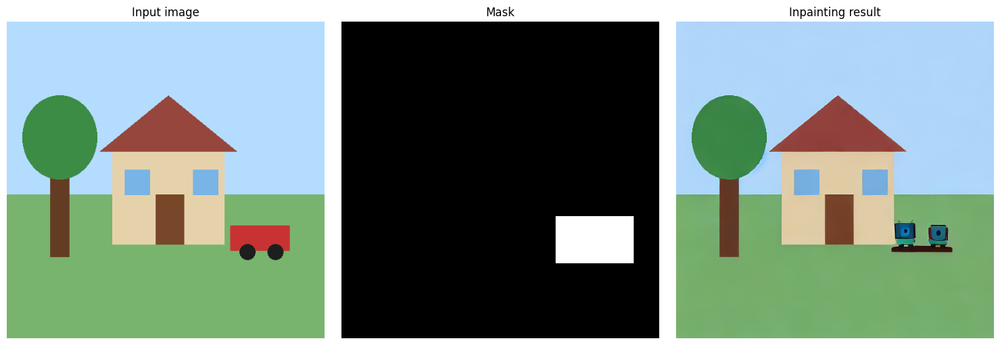

Saved:
  /kaggle/working/stable_diffusion_lab_outputs/inpainting_result_00.png


In [39]:
if RUN_INPAINTING:
    inpaint_prompt = "A small friendly robot, high resolution, sitting on a park bench"
    inpaint_negative_prompt = "blurry, low quality, distorted, bad anatomy"

    generator = torch.Generator(device=DEVICE).manual_seed(42)

    inpaint_result = inpaint_pipe(
        prompt=inpaint_prompt,
        negative_prompt=inpaint_negative_prompt,
        image=init_image,
        mask_image=mask_image,
        guidance_scale=8.0,
        num_inference_steps=30,
        generator=generator,
    ).images[0]

    show_images(
        [init_image, mask_image, inpaint_result],
        titles=["Input image", "Mask", "Inpainting result"],
        cols=3,
        figsize=(15, 5)
    )

    save_images(inpaint_result, "inpainting_result")

### Контрольні питання до Inpainting

1. В Inpainting редагується біла частина маски. Чорна частина залишається збереженою з початкового зображення.

2. Inpainting потребує і `image`, і `mask`, тому що `image` дає моделі початковий контекст сцени, а `mask` показує, яку саме область потрібно змінити. Без маски модель не знала б, де виконувати редагування.

3. Якщо зробити маску більшою, модель отримає більше простору для генерації. Це може допомогти краще вставити новий об’єкт, але водночас більше частин початкового зображення буде змінено.

4. Якщо prompt погано відповідає формі masked-області, результат може бути менш якісним. Модель буде намагатися вставити об’єкт у задану область, але можуть з’явитися спотворення, неправильні пропорції або зайві деталі.


# 20. Depth2Img pipeline

`Depth2Img` використовує depth map початкового зображення.  
Це допомагає зберігати просторову структуру, але змінювати стиль і зміст.

Цей блок опційний, бо завантажує окрему модель:

```text
 sd2-community/stable-diffusion-2-depth
```

Якщо GPU або disk space обмежені, залиште:

```python
RUN_DEPTH2IMG = False
```

model_index.json:   0%|          | 0.00/545 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/372 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--sd2-community--stable-diffusion-2-depth/snapshots/6cb92dd9430a7f6da8d9e99d7b60acdebcc348b7/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/414 [00:00<?, ?it/s]

Depth2Img pipeline loaded: StableDiffusionDepth2ImgPipeline
Pipeline components:
vae                  -> AutoencoderKL
text_encoder         -> CLIPTextModel
tokenizer            -> CLIPTokenizer
unet                 -> UNet2DConditionModel
scheduler            -> PNDMScheduler
depth_estimator      -> DPTForDepthEstimation
feature_extractor    -> DPTImageProcessor


  0%|          | 0/22 [00:00<?, ?it/s]

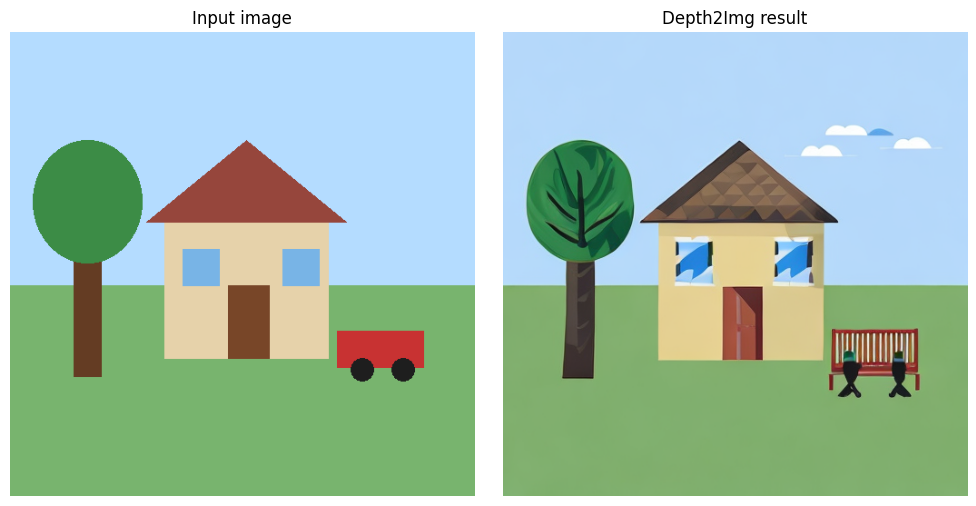

Saved:
  /kaggle/working/stable_diffusion_lab_outputs/depth2img_result_00.png


In [40]:
if RUN_DEPTH2IMG:
    clear_gpu()

    DEPTH_MODEL_ID = "sd2-community/stable-diffusion-2-depth"

    depth_pipe = StableDiffusionDepth2ImgPipeline.from_pretrained(
        DEPTH_MODEL_ID,
        torch_dtype=DTYPE       
    ).to(DEVICE)

    depth_pipe.enable_attention_slicing()

    print("Depth2Img pipeline loaded:", type(depth_pipe).__name__)

    print_pipeline(depth_pipe)
    
    depth_prompt = "An oil painting of a person sitting on a bench, cinematic lighting"
    generator = torch.Generator(device=DEVICE).manual_seed(42)

    depth_result = depth_pipe(
        prompt=depth_prompt,
        image=init_image,
        negative_prompt="blurry, low quality, distorted",
        strength=0.75,
        guidance_scale=7.5,
        num_inference_steps=30,
        generator=generator,
    ).images[0]

    show_images(
        [init_image, depth_result],
        titles=["Input image", "Depth2Img result"],
        cols=2,
        figsize=(10, 5)
    )

    save_images(depth_result, "depth2img_result")
else:
    print("Depth2Img пропущено. Щоб запустити, встановіть RUN_DEPTH2IMG = True у секції налаштувань.")

| Pipeline      | Стартова точка                                            | Основні параметри                                                                                                           | Що контролює результат                                                                                             |
| ------------- | --------------------------------------------------------- | --------------------------------------------------------------------------------------------------------------------------- | ------------------------------------------------------------------------------------------------------------------ |
| Text-to-Image | Випадковий шум у latent space                             | `prompt`, `negative_prompt`, `guidance_scale`, `num_inference_steps`, `generator / seed`, `height`, `width`                 | Текстовий опис, negative prompt, seed, scheduler, кількість denoising-кроків і сила слідування prompt              |
| DIY sampling  | Випадковий latent, створений вручну                       | `prompt`, `negative_prompt`, `guidance_scale`, `num_inference_steps`, `seed`, scheduler                                     | Ручний denoising loop, prompt embeddings, прогноз шуму UNet, classifier-free guidance і кроки scheduler-а          |
| Img2Img       | Початкове зображення, закодоване у latent space через VAE | `image`, `prompt`, `negative_prompt`, `strength`, `guidance_scale`, `num_inference_steps`, `generator / seed`               | Початкове зображення задає композицію, `strength` задає силу змін, prompt змінює стиль або зміст сцени             |
| Inpainting    | Початкове зображення + mask                               | `image`, `mask_image`, `prompt`, `negative_prompt`, `strength`, `guidance_scale`, `num_inference_steps`, `generator / seed` | Маска задає область редагування, prompt визначає новий зміст у masked-області, image зберігає контекст сцени       |
| Depth2Img     | Початкове зображення + depth map / інформація про глибину | `image`, `prompt`, `negative_prompt`, `strength`, `guidance_scale`, `num_inference_steps`, `generator / seed`               | Depth information допомагає зберегти просторову структуру сцени, prompt змінює стиль, об’єкти або візуальні деталі |


# 22. Рівні складності лабораторної

## Рівень “Задовільно”

Студент має:

- запустити notebook на GPU;
- виконати всі розділи і завдання під ними та відповісти на всі запитання в кінці розділів;
- пояснити параметри `prompt`, `negative_prompt`, `guidance_scale`, `num_inference_steps`;
- пояснити експеримент з 3 значеннями `guidance_scale` для Text-to-Image;
- пояснити експеримент з 3 значеннями `strength` для Image-to-Image;
- порівняти Text-to-Image, Image-to-Image та Inpainting;
- заповнити звіт з п.23

## Рівень “Добре”

Усе з рівня “Задовільно”, а також:

- пояснити DIY sampling loop;
- змінити scheduler і порівняти результат;
- використати власне безпечне input image і mask;
- провести системний експеримент: `steps × guidance_scale`;
- додати свої результати у звіт
  
## Рівень “Відмінно”

Усе з рівнів "Задовільно" та "Добре" 
та виконати завдання з ноутбуку Dreambooth



# Звіт з лабораторної роботи

## 1. Тема роботи

Stable Diffusion pipelines у Diffusers: Text-to-Image, Img2Img, Inpainting, Depth2Img.

## 2. Мета роботи

Метою роботи було вивчити основні pipeline Stable Diffusion у бібліотеці Diffusers, а також зрозуміти роль ключових параметрів генерації: `prompt`, `negative_prompt`, `guidance_scale`, `num_inference_steps`, `seed`, `strength`, `image` та `mask_image`. Окремо було розглянуто внутрішні компоненти pipeline: VAE, tokenizer, text encoder, UNet і scheduler.

## 3. Середовище

| Параметр          | Значення                                      |
| ----------------- | --------------------------------------------- |
| Kaggle GPU        | T4 x2          |
| Python version    | 3.12.13                                       |
| PyTorch version   | 2.10.0+cu128                                  |
| Diffusers version | 0.37.1                                        |
| Model ID          | `stable-diffusion-v1-5/stable-diffusion-v1-5` |
| Device            | `cuda`                                        |

## 4. Text-to-Image

Prompt:

```text
Palette knife painting of an autumn cityscape
```

Negative prompt:

```text
Oversaturated, blurry, low quality
```

Параметри:

| Parameter           | Value     |
| ------------------- | --------- |
| guidance_scale      | 8.0       |
| num_inference_steps | 30        |
| seed                | 42        |
| height × width      | 512 × 512 |

Короткий аналіз результату:

```text
У результаті Text-to-Image модель згенерувала осінній міський пейзаж у стилі palette knife painting. Основні елементи prompt були враховані: видно міську сцену, осінні кольори та живописний стиль. Negative prompt допоміг зменшити розмитість і перенасичення. При guidance_scale = 8.0 результат виглядає достатньо збалансовано: prompt добре виконується, але зображення не виглядає надто штучним.
```

## 5. Pipeline components

* VAE: стискає зображення з pixel space у latent space і декодує latent назад у звичайне RGB-зображення.
* Tokenizer: перетворює текстовий prompt у token IDs, з якими може працювати text encoder.
* Text encoder: перетворює token IDs у text embeddings, які передаються в UNet.
* UNet: прогнозує шум у latent representation на кожному denoising-кроці.
* Scheduler: задає timesteps і визначає, як оновлювати latent після прогнозу шуму від UNet.

## 6. VAE experiment

| Tensor         | Shape              |
| -------------- | ------------------ |
| input image    | `(1, 3, 512, 512)` |
| raw latents    | `(1, 4, 64, 64)`   |
| scaled latents | `(1, 4, 64, 64)`   |
| decoded image  | `(1, 3, 512, 512)` |

Пояснення `scaling_factor`:

```text
VAE scaling_factor у цьому notebook дорівнює 0.18215. Він потрібен для правильного масштабу latent-представлення. Після VAE encoder latent множиться на scaling_factor, щоб відповідати масштабу, з яким працює UNet. Перед VAE decoder виконується зворотна операція: latent ділиться на scaling_factor. Якщо цього не зробити, decoder отримає значення у неправильному масштабі, і результат може мати шум, дивні кольори або артефакти.
```

## 7. Img2Img

Порівняння `strength`:

| strength | Що збереглося                                                                                        | Що змінилося                                                                                 | Якість                                                          |
| -------: | ---------------------------------------------------------------------------------------------------- | -------------------------------------------------------------------------------------------- | --------------------------------------------------------------- |
|     0.25 | Майже повністю збереглася початкова структура: будинок, дерево, трава, небо і розташування об’єктів. | Зображення стало трохи більш художнім, але prompt вплинув слабко.                            | Добре зберігає input image, але зміни мінімальні.               |
|     0.55 | Основна композиція ще зберігається, але об’єкти починають помітніше змінюватися.                     | З’являється більше деталей, стиль стає ближчим до prompt, сцена виглядає більш переробленою. | Найбільш збалансований варіант між збереженням input і змінами. |
|     0.85 | Початкове зображення зберігається вже слабко, залишається тільки загальна ідея сцени.                | Модель значно сильніше орієнтується на prompt і створює майже нову сцену з людиною на лавці. | Найсильніше виконує prompt, але input image майже зникає.       |

## 8. Inpainting

У цьому експерименті редагувалася область, позначена білою частиною маски. У власному безпечному зображенні маска була розміщена в зоні машини, тому саме ця частина мала бути змінена.

Prompt:

```text
A small friendly robot, high resolution, sitting on a park bench
```

Negative prompt:

```text
blurry, low quality, distorted, bad anatomy
```

Фон зберігся добре, тому що чорна частина маски не редагується. Будинок, дерево, небо і трава залишаються близькими до початкового зображення. Основні зміни відбулися тільки в masked-області. Можливі артефакти пов’язані з тим, що prompt може не повністю відповідати формі та розміру виділеної області. Через це об’єкт може виглядати дещо неприродно або мати неточні пропорції.

## 9. Порівняння pipeline

| Pipeline      | Переваги                                                                            | Недоліки                                                                                     | Коли використовувати                                                                       |
| ------------- | ----------------------------------------------------------------------------------- | -------------------------------------------------------------------------------------------- | ------------------------------------------------------------------------------------------ |
| Text-to-Image | Дозволяє створити повністю нове зображення тільки за текстовим описом.              | Немає контролю через input image, результат сильно залежить від prompt і seed.               | Коли потрібно згенерувати нову сцену з нуля.                                               |
| Img2Img       | Дозволяє використати початкове зображення як основу і змінити його стиль або зміст. | При високому `strength` input image може майже зникнути, при низькому prompt впливає слабко. | Коли потрібно переробити або стилізувати все зображення.                                   |
| Inpainting    | Дозволяє редагувати тільки вибрану область через mask, зберігаючи решту зображення. | Якість сильно залежить від точності маски і відповідності prompt формі masked-області.       | Коли потрібно замінити або додати окремий об’єкт у конкретній частині зображення.          |
| Depth2Img     | Краще зберігає просторову структуру сцени завдяки depth information.                | Потребує окремої моделі і більше ресурсів.                                                   | Коли потрібно змінити стиль або зміст, але зберегти глибину і просторову композицію сцени. |

## 10. Етичний висновок

```text
Генерація та редагування зображень мають кілька ризиків. По-перше, такі моделі можуть створювати реалістичні зображення, які складно відрізнити від справжніх. Це може використовуватися для дезінформації або створення фейкового контенту. По-друге, редагування через Inpainting дозволяє змінювати окремі частини зображення, тому важливо не використовувати такі інструменти для обману або підробки доказів. По-третє, prompt може випадково створити небажаний або некоректний результат, тому потрібно використовувати negative prompt і перевіряти згенеровані зображення. У навчальній роботі використовувалися безпечні штучні input images і нейтральні prompts.
```

## 11. Загальний висновок

```text
У лабораторній роботі було розглянуто основні pipeline Stable Diffusion у Diffusers. Text-to-Image показав, як модель створює зображення з випадкового шуму за текстовим описом. Img2Img продемонстрував вплив параметра strength: менші значення краще зберігають input image, а більші дають моделі більше свободи для зміни сцени. Inpainting виявився найкращим pipeline для редагування окремої частини зображення, тому що область зміни задається маскою. Depth2Img дозволив зберегти просторову структуру сцени за рахунок інформації про глибину.

Також було розглянуто внутрішні компоненти Stable Diffusion: VAE, tokenizer, text encoder, UNet і scheduler. Окремий VAE experiment показав, що зображення 512×512 стискається до latent-представлення 64×64, що робить генерацію швидшою і менш вимогливою до пам’яті. У результаті роботи було отримано практичне розуміння того, як різні параметри і pipeline впливають на якість, стиль і контрольованість генерації.
```


# 24. Troubleshooting

## CUDA out of memory

Спробуйте:

```python
IMAGE_HEIGHT = 384
IMAGE_WIDTH = 384
```

або зменшити:

```python
num_inference_steps = 20
```

Також можна вимкнути важкі секції:

```python
RUN_INPAINTING = False
RUN_DEPTH2IMG = False
```

## Модель не завантажується

Перевірте:

```text
Kaggle Internet: On
HF_TOKEN: створений і доданий у Secrets
ліцензію моделі прийнято на Hugging Face
```

## Notebook зависає на pip install

Це може зайняти кілька хвилин. Якщо занадто довго:

1. Interrupt execution.
2. Restart session.
3. Запустіть cells по черзі.

## Результати не відтворюються

Перевірте, що використовується однаковий:

```python
seed
prompt
negative_prompt
guidance_scale
num_inference_steps
scheduler
model_id
```

# 25. Джерела

1. Hugging Face Diffusion Course, Unit 3, lesson 2:  
   https://huggingface.co/learn/diffusion-course/unit3/2

2. Diffusers documentation:  
   https://huggingface.co/docs/diffusers

3. Stable Diffusion pipelines in Diffusers:  
   https://huggingface.co/docs/diffusers/api/pipelines/stable_diffusion/overview

4. Hugging Face Hub authentication:  
   https://huggingface.co/docs/huggingface_hub